# HAI923I - Machine Learning 2 - Projet

**Awa SECK (N° étudiant : 22016801)**

**Mitra AELAMI (N° étudiant : 22113989)**

**Lorenzo PUCCIO (N° étudiant : 21904376)**

**Arthur SAPIN (N° étudiant : 22200824)**


## 0. Installation, définition des jeux de données



Avant de commencer, il est nécessaire de déjà posséder dans son environnement toutes les librairies utiles. Dans la seconde cellule nous importons toutes les librairies qui seront utiles à ce notebook. Il se peut que, lorsque vous lanciez l'éxecution de cette cellule, une soit absente. Dans ce cas il est nécessaire de l'installer. Pour cela dans la cellule suivante utiliser la commande :  

*! pip install nom_librairie*  

**Attention :** il est fortement conseillé lorsque l'une des librairies doit être installer de relancer le kernel de votre notebook.

**Remarque :** même si toutes les librairies sont importées dès le début, les librairies utiles pour des fonctions présentées au cours de ce notebook sont ré-importées de manière à indiquer d'où elles viennent et ainsi faciliter la réutilisation de la fonction dans un autre projet.



In [ ]:
# utiliser cette cellule pour installer les librairies manquantes
# pour cela il suffit de taper dans cette cellule : !pip install nom_librairie_manquante
# d'exécuter la cellule et de relancer la cellule suivante pour voir si tout se passe bien
# recommencer tant que toutes les librairies ne sont pas installées ...

# sous Colab il faut déjà intégrer ces deux librairies

#!pip install umap-learn[plot]
#!pip install holoviews
#!pip install -U ipykernel

# eventuellement ne pas oublier de relancer le kernel du notebook

In [69]:
# Importation des différentes librairies utiles pour le notebook

#Sickit learn met régulièrement à jour des versions et
#indique des futurs warnings.
#ces deux lignes permettent de ne pas les afficher.
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# librairies générales
import pickle
import pandas as pd
from scipy.stats import randint
import numpy as np
import string
import time
import base64
import re
import sys
import copy
# from random import randint
from numpy import mean
from numpy import std
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy.random import randint


# librairie affichage
from matplotlib import pyplot
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px

from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

from mpl_toolkits.mplot3d import Axes3D

# TensorFlow et keras
import tensorflow as tf
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import img_to_array, load_img
from keras.callbacks import ModelCheckpoint, EarlyStopping
import keras
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, Reshape, Conv2DTranspose, LeakyReLU, UpSampling2D, Activation, InputLayer, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, GlobalMaxPooling2D, GlobalAveragePooling2D, Input, Lambda
from keras.preprocessing import image
from tqdm import tqdm
from keras.models import load_model
from sklearn.model_selection import KFold
from keras.datasets import fashion_mnist
from keras import backend as K
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
import os
from os import listdir
from os.path import isfile, join
import cv2
import glob
from glob import glob

Pour pouvoir sauvegarder sur votre répertoire Google Drive, il est nécessaire de fournir une autorisation. Pour cela il suffit d'éxecuter la ligne suivante et de saisir le code donné par Google.

In [ ]:
# pour monter son drive Google Drive local
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Corriger éventuellement la ligne ci-dessous pour mettre le chemin vers un répertoire spécifique dans votre répertoire Google Drive :

In [ ]:
import sys

my_local_drive='/content/gdrive/My Drive/Colab Notebooks/HAI923I_Projet'
# Ajout du path pour les librairies, fonctions et données
sys.path.append(my_local_drive)
# Se positionner sur le répertoire associé
%cd $my_local_drive

%pwd

/content/gdrive/MyDrive/Colab Notebooks/HAI923I/HAI923I_Projet


'/content/gdrive/MyDrive/Colab Notebooks/HAI923I/HAI923I_Projet'

In [ ]:
def plot_curves_confusion (histories,confusion_matrix,class_names):
  plt.figure(1,figsize=(16,6))
  plt.gcf().subplots_adjust(left = 0.125, bottom = 0.2, right = 1,
                          top = 0.9, wspace = 0.25, hspace = 0)

  # division de la fenêtre graphique en 1 ligne, 3 colonnes,

  for i in range(len(histories)):
    # 1 - loss fonction
    plt.subplot(1,3,1)
    plt.plot(histories[i].history['loss'], color='blue', label='train')
    plt.plot(histories[i].history['val_loss'], color='red', label='test')
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['Training loss', 'Validation loss'], loc='upper left')

    # 2 - accuracy
    plt.subplot(1,3,2)
    plt.plot(histories[i].history['accuracy'], color='blue', label='train')
    plt.plot(histories[i].history['val_accuracy'], color='red', label='test')
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')

    # 3 - matrice de correlation
    plt.subplot(1,3,3)
    sns.heatmap(confusion_matrix,annot=True,fmt="d",cmap='Blues',xticklabels=class_names, yticklabels=class_names)# label=class_names)
    # labels, title and ticks
    plt.xlabel('Predicted values', fontsize=12)
    #plt.set_label_position('top')
    #plt.set_ticklabels(class_names, fontsize = 8)
    #plt.tick_top()
    plt.title("model correlation matrix")
    plt.ylabel('Real values', fontsize=12)
    #plt.set_ticklabels(class_names, fontsize = 8)
  plt.show()


def plot_curves(histories):
    plt.figure(1,figsize=(16,6))
    plt.gcf().subplots_adjust(left = 0.125, bottom = 0.2, right = 1,
                          top = 0.9, wspace = 0.25, hspace = 0)
    for i in range(len(histories)):
        # plot loss
        plt.subplot(121)
        plt.title('Cross Entropy Loss')
        plt.plot(histories[i].history['loss'], color='blue', label='train')
        plt.plot(histories[i].history['val_loss'], color='red', label='test')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.legend(['Training loss', 'Validation loss'], loc='upper left')
        # plot accuracy
        plt.subplot(122)
        plt.title('Classification Accuracy')
        plt.ylabel('accuracy')
        plt.xlabel('epoch')
        plt.plot(histories[i].history['accuracy'], color='blue', label='train')
        plt.plot(histories[i].history['val_accuracy'], color='red',
                  label='test')
        plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')
    plt.show()

Récupération des jeux de données :      

In [ ]:
# J'ai tout commenté pour éviter de télécharger l'archive de nouveau par accident

#!wget https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip
#import zipfile
#with zipfile.ZipFile("Tiger-Fox-Elephant.zip","r") as zip_ref:
#    zip_ref.extractall("Data_Project")

Définition de constante globale      


In [ ]:
# constantes globales

IMG_SIZE = 124 # Taille de l'image souhaitée
COLUMNS = 25 # Nombre d'images à afficher dans une grille
PATH_TO_DATA = "Data_Project/Tiger-Fox-Elephant/" # Chemin vers l'ensemble des jeux de données
PATH_TO_MODELS = "models/" # Chemin vers les modèles générés du projet

**Créer le jeu de données**   

Actuellement pour chaque animal nous avons un répertoire qui contient des images positives et un répertoire qui contient des images négatives. Pour pouvoir créer un jeu de données nous devons obtenir X et y. Les fonctions ci-dessous permettent de générer, à partir des répertoires, un jeu de données aléatoire pour X et y.

In [ ]:
def create_training_data(path_data, list_classes):
  training_data=[]
  for classes in list_classes:
      path=os.path.join(path_data, classes)
      class_num=list_classes.index(classes)
      for img in os.listdir(path):
        try:
          img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_UNCHANGED)
          new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
          training_data.append([new_array, class_num])
        except Exception as e:
          pass
  return training_data

def create_X_y (path_data, list_classes):
      # récupération des données
      training_data=create_training_data(path_data, list_classes)
      # tri des données
      random.shuffle(training_data)
      # création de X et y
      X=[]
      y=[]
      for features, label in training_data:
        X.append(features)
        y.append(label)
      X=np.array(X).reshape(-1,IMG_SIZE, IMG_SIZE, 3)
      y=np.array(y)
      return X,y

def plot_examples(X,y):
  plt.figure(figsize=(15,15))
  for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    X[i] = cv2.cvtColor(X[i], cv2.COLOR_BGR2RGB)
    plt.imshow(X[i]/255.,cmap=plt.cm.binary)
    plt.xlabel('classe ' + str(y[i]))

Pour les tigres :

In [ ]:
my_classes=['tiger','Tiger_negative_class']
X,y=create_X_y(PATH_TO_DATA,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
# On crée un df temporaire pour éviter un bug lors du plot
tempY = pd.DataFrame({'y': y})
sns.countplot(x='y', data=tempY)
plt.title("Nombre d'éléments par classe")
# affichage
plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

# Instanciation du dataframe des tigres
X_tiger = copy.deepcopy(X)
y_tiger = copy.deepcopy(y)

Output hidden; open in https://colab.research.google.com to view.

Pour les éléphants :     

In [ ]:
my_classes=['elephant','Elephant_negative_class']
X,y=create_X_y (PATH_TO_DATA,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
# On crée un df temporaire pour éviter un bug lors du plot
tempY = pd.DataFrame({'y': y})
sns.countplot(x='y', data=tempY)
plt.title("Nombre d'éléments par classe")
# affichage
plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

# Instanciation du dataframe des éléphants
X_elephant = copy.deepcopy(X)
y_elephant = copy.deepcopy(y)

Output hidden; open in https://colab.research.google.com to view.

Pour les renards :     


In [ ]:
my_classes=['fox','Fox_negative_class']
X,y=create_X_y (PATH_TO_DATA,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
# On crée un df temporaire pour éviter un bug lors du plot
tempY = pd.DataFrame({'y': y})
sns.countplot(x='y', data=tempY)
plt.title("Nombre d'éléments par classe")
# affichage
plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

# Instanciation du dataframe des renards
X_fox = copy.deepcopy(X)
y_fox = copy.deepcopy(y)

Output hidden; open in https://colab.research.google.com to view.

## Visualisation de données 2D/3D

In [ ]:
def plot_2d_Group_scatter(X, y, labels):

    fig, plot = plt.subplots()
    fig.set_size_inches(10, 10)
    plt.prism()

    for i in range(len(labels)):
        digit_indices = (y == i)
        dim0 = X[digit_indices, 0]
        dim1 = X[digit_indices, 1]
        plot.scatter(dim0, dim1, label=f"{labels[i]}")


    plot.set_xticks(())
    plot.set_yticks(())

    plt.tight_layout()
    plt.legend()
    plt.show()

In [ ]:
X_fox_vis = X_fox.reshape(X_fox.shape[0],IMG_SIZE*IMG_SIZE*3)
X_tiger_vis = X_tiger.reshape(X_tiger.shape[0],IMG_SIZE*IMG_SIZE*3)
X_elephant_vis = X_elephant.reshape(X_elephant.shape[0],IMG_SIZE*IMG_SIZE*3)

### Renards

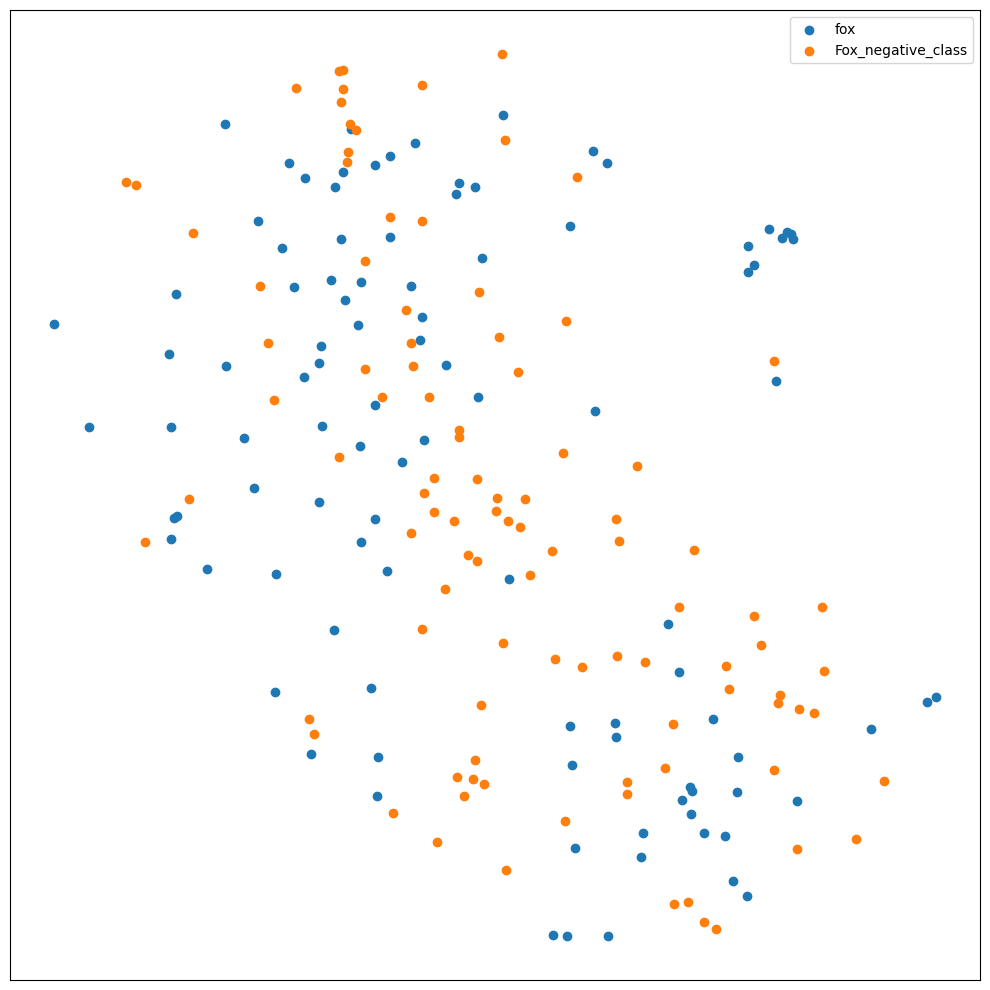

In [ ]:
tsne_embedding = TSNE(n_components=2, perplexity=40).fit_transform(X_fox_vis)
plot_2d_Group_scatter(tsne_embedding, y_fox.astype(int), ['fox','Fox_negative_class'])

In [ ]:
# Supposons que X_FOX contient vos données d'image (chaque image est une ligne)

# Réduire la dimensionnalité à 3 dimensions avec PCA
pca = PCA(n_components=3)
X_FOX_3D = pca.fit_transform(X_fox_vis)

# Créer un DataFrame pour Plotly
df = pd.DataFrame(data=X_FOX_3D, columns=["Dimension 1", "Dimension 2", "Dimension 3"])
df["Class"] = y_fox  # Ajoutez la classe à votre DataFrame

# Créer une visualisation 3D interactive avec Plotly
fig = px.scatter_3d(df, x="Dimension 1", y="Dimension 2", z="Dimension 3", color="Class")

# Personnaliser la visualisation (ajoutez des titres, étiquettes, etc., selon vos besoins)

# Afficher la visualisation interactive
fig.show()

### Elephants

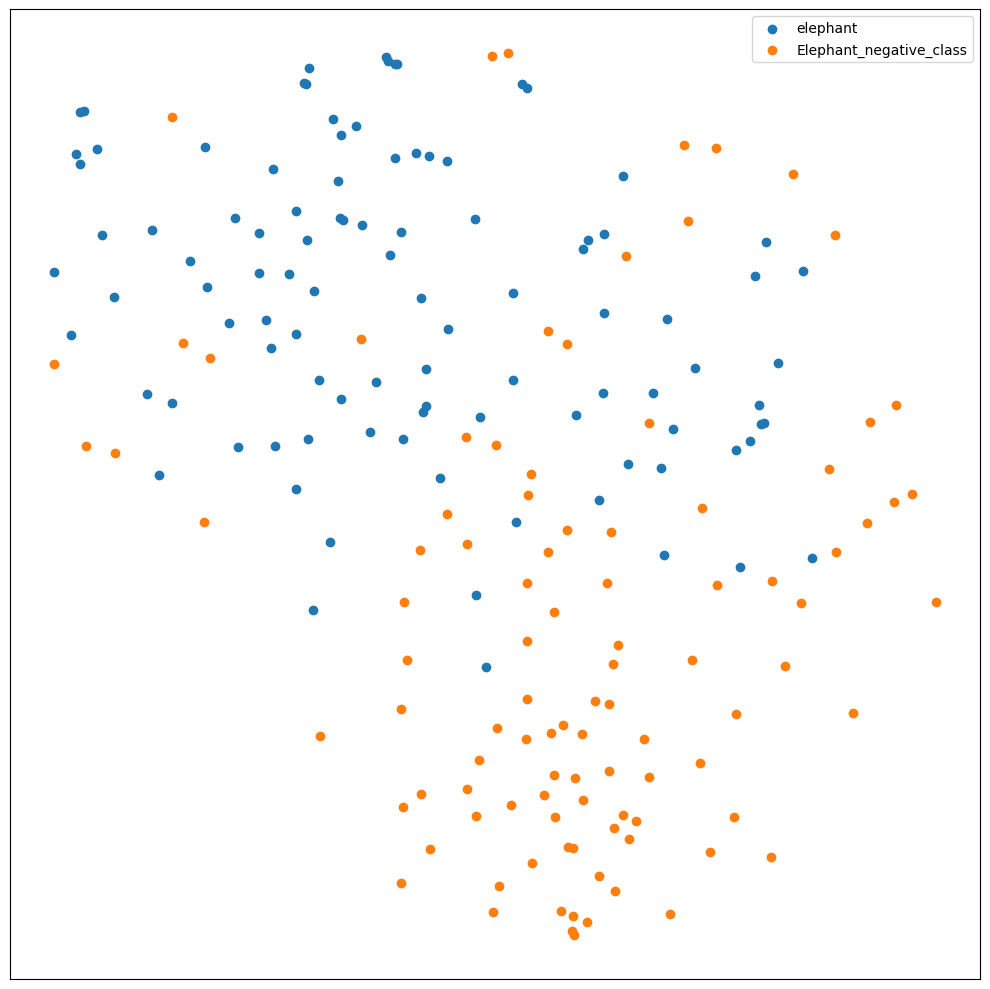

In [ ]:
tsne_embedding = TSNE(n_components=2, perplexity=40).fit_transform(X_elephant_vis)
plot_2d_Group_scatter(tsne_embedding, y_elephant.astype(int), ['elephant','Elephant_negative_class'])

In [ ]:
# Réduire la dimensionnalité à 3 dimensions avec PCA
pca = PCA(n_components=3)
X_Elephant_3D = pca.fit_transform(X_elephant_vis)

# Créer un DataFrame pour Plotly
df = pd.DataFrame(data=X_Elephant_3D, columns=["Dimension 1", "Dimension 2", "Dimension 3"])
df["Class"] = y_elephant  # Ajoutez la classe à votre DataFrame

# Créer une visualisation 3D interactive avec Plotly
fig = px.scatter_3d(df, x="Dimension 1", y="Dimension 2", z="Dimension 3", color="Class")

# Personnaliser la visualisation (ajoutez des titres, étiquettes, etc., selon vos besoins)

# Afficher la visualisation interactive
fig.show()

### Tigres

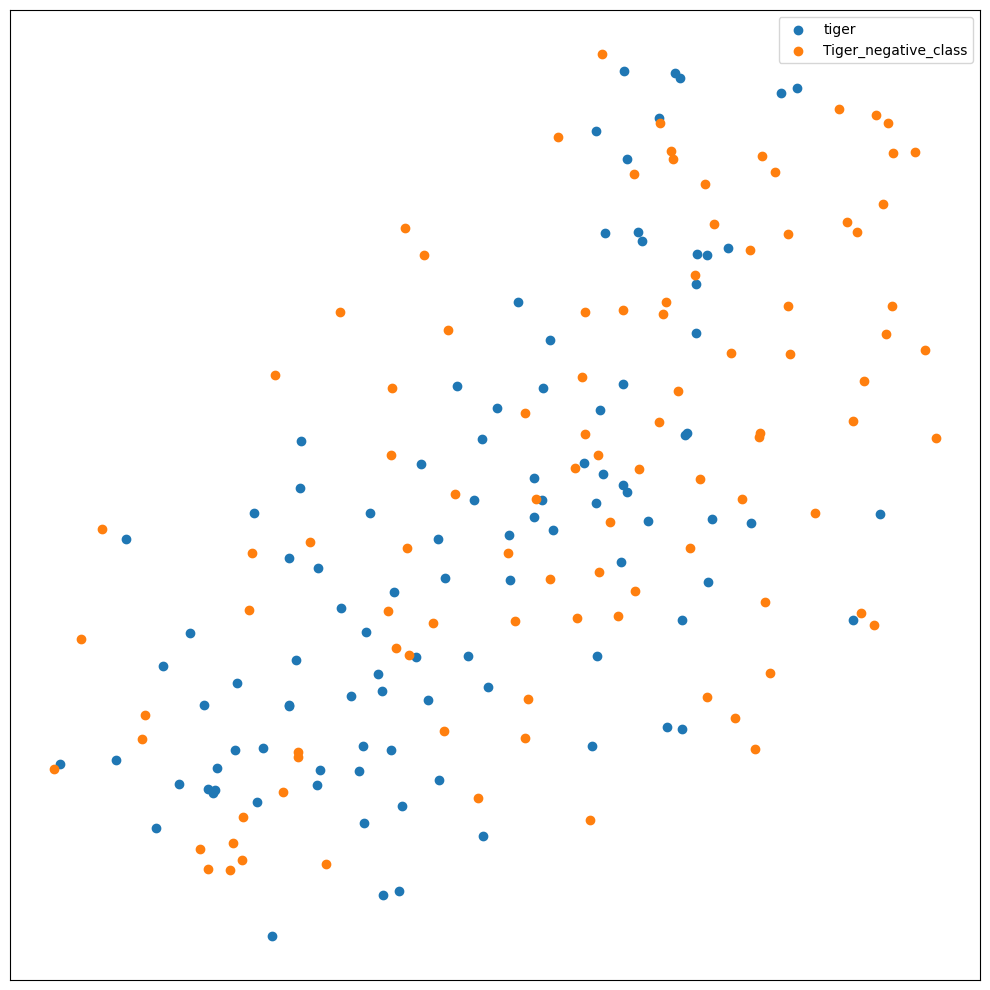

In [ ]:
tsne_embedding = TSNE(n_components=2, perplexity=40).fit_transform(X_tiger_vis)
plot_2d_Group_scatter(tsne_embedding, y_tiger.astype(int), ['tiger','Tiger_negative_class'])

In [ ]:
# Réduire la dimensionnalité à 3 dimensions avec PCA
pca = PCA(n_components=3)
X_Tiger_3D = pca.fit_transform(X_tiger_vis)

# Créer un DataFrame pour Plotly
df = pd.DataFrame(data=X_Tiger_3D, columns=["Dimension 1", "Dimension 2", "Dimension 3"])
df["Class"] = y_tiger  # Ajoutez la classe à votre DataFrame

# Créer une visualisation 3D interactive avec Plotly
fig = px.scatter_3d(df, x="Dimension 1", y="Dimension 2", z="Dimension 3", color="Class")

# Personnaliser la visualisation (ajoutez des titres, étiquettes, etc., selon vos besoins)

# Afficher la visualisation interactive
fig.show()

## 1. Définition et évaluation du modèle *baseline*

**Fonctions de lancement**

In [ ]:
# Evaluation avec un k-fold
def evaluate_model(modelThing, dataX, dataY, n_folds=5, epochs=10, batch_size=32):
  scores, histories, confs = list(), list(), list()
  kfold = KFold(n_folds, shuffle=True, random_state=1)
  # Parcourir les splits du k-fold
  for train_ix, test_ix in kfold.split(dataX):
    if isinstance(modelThing, str): # modelThing est le nom d'un modèle dans le dossier models
      model = load_model(PATH_TO_MODELS+modelThing)
    else: # modelThing est le nom d'une fonction rendant un modèle
      model = modelThing()
    # Sélection des données
    X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]
    # Fit du modele
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test), verbose=1)
    # Evaluate du modele
    loss, acc = model.evaluate(X_test, y_test, verbose=0)
    print('accuracy %.3f' % (acc * 100.0))
    scores.append(acc)
    histories.append(history)
    predict_y=model.predict(X_test)
    y_pred=np.argmax(predict_y,axis=1)
    conf=confusion_matrix(y_test,y_pred)
    confs.append(conf)
  return scores, histories, confs

# Matrice de confusion générale
def create_bigconf_from_confs(confs):
  bigconf = np.zeros((2, 2), dtype=int)
  for i in range(len(confs)):
    tn, fp, fn, tp = confs[i].ravel()
    bigconf[0, 0] += tn
    bigconf[0, 1] += fp
    bigconf[1, 0] += fn
    bigconf[1, 1] += tp
  return bigconf

# Fonction pour charger, transformer et évaluer le modèle, elle lance n-folds fois l'évaluation et affiche les courbes et résultats
def run_evaluation(model, inputs, targets, n_folds, epochs, batch_size):
  print(inputs.shape)
  print(targets.shape)
  scores, histories, confs = evaluate_model(model, inputs, targets, n_folds, epochs, batch_size)
  bigconf = create_bigconf_from_confs(confs)
  plot_curves_confusion(histories=histories, confusion_matrix=bigconf, class_names=['not_animal', 'animal'])
  print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))

# Fonction pour sauvegarder un modèle (ne donner que le nom)
def save_model(filename, model, Xdata, Ydata, epochs_data, batch_size_data):
  model = model()
  model.fit(Xdata, Ydata, epochs=epochs_data, batch_size=batch_size_data, verbose=1)
  model.save(PATH_TO_MODELS+filename+".h5", save_format="h5")

**Fonction de création du modèle *baseline***

In [ ]:
def define_model_baseline():
  model_baseline = Sequential()

  # Convolution and pooling
  model_baseline.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3), name="Conv2D_1", padding="same", strides=1))
  model_baseline.add(MaxPooling2D(pool_size=(2, 2), name="Maxpooling2D_1"))

  # Flatten
  model_baseline.add(Flatten(name="flatten") )

  # Classification
  model_baseline.add(Dense(100, activation='relu'))
  model_baseline.add(Dense(2, activation='sigmoid'))

  model_baseline.compile(optimizer='adam', loss='sparse_categorical_crossentropy',metrics=['accuracy'])

  return model_baseline

In [ ]:
define_model_baseline().summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 124, 124, 32)      896       
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 62, 62, 32)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 123008)            0         
                                                                 
 dense (Dense)               (None, 100)               12300900  
                                                                 
 dense_1 (Dense)             (None, 2)                 202       
                                                                 
Total params: 12301998 (46.93 MB)
Trainable params: 12301998 (46.93 MB)
Non-trainable params: 0 (0.00 Byte)
______________

**Images de tigres**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 8s 35ms/step - loss: 6.6946 - accuracy: 0.4222 - val_loss: 0.7125 - val_accuracy: 0.4000
Epoch 2/10
12/12 [==============================] - 0s 14ms/step - loss: 0.6953 - accuracy: 0.4556 - val_loss: 0.6924 - val_accuracy: 0.6000
Epoch 3/10
12/12 [==============================] - 0s 12ms/step - loss: 0.6933 - accuracy: 0.4889 - val_loss: 0.6926 - val_accuracy: 0.6000
Epoch 4/10
12/12 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.4889 - val_loss: 0.6926 - val_accuracy: 0.6000
Epoch 5/10
12/12 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.4889 - val_loss: 0.6930 - val_accuracy: 0.6000
Epoch 6/10
12/12 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.4889 - val_loss: 0.6931 - val_accuracy: 0.6000
Epoch 7/10
12/12 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.4778 - val_loss: 0.6935 - val_accu

1/1 [==============================] - 0s 61ms/step
Epoch 1/10
12/12 [==============================] - 1s 44ms/step - loss: 4.4755 - accuracy: 0.4889 - val_loss: 2.4576 - val_accuracy: 0.5500
Epoch 2/10
12/12 [==============================] - 0s 26ms/step - loss: 0.8882 - accuracy: 0.6611 - val_loss: 0.4642 - val_accuracy: 0.8000
Epoch 3/10
12/12 [==============================] - 0s 29ms/step - loss: 0.4370 - accuracy: 0.7778 - val_loss: 0.5096 - val_accuracy: 0.7000
Epoch 4/10
12/12 [==============================] - 0s 18ms/step - loss: 0.3096 - accuracy: 0.8778 - val_loss: 0.4028 - val_accuracy: 0.8500
Epoch 5/10
12/12 [==============================] - 0s 20ms/step - loss: 0.1896 - accuracy: 0.9500 - val_loss: 0.4309 - val_accuracy: 0.8500
Epoch 6/10
12/12 [==============================] - 0s 26ms/step - loss: 0.1523 - accuracy: 0.9667 - val_loss: 0.3989 - val_accuracy: 0.8500
Epoch 7/10
12/12 [==============================] - 0s 14ms/step - loss: 0.0841 - accuracy: 0.9944 - v

1/1 [==============================] - 0s 89ms/step
Epoch 1/10
12/12 [==============================] - 2s 34ms/step - loss: 5.3542 - accuracy: 0.5111 - val_loss: 0.6809 - val_accuracy: 0.6000
Epoch 2/10
12/12 [==============================] - 0s 15ms/step - loss: 0.8467 - accuracy: 0.6056 - val_loss: 0.5347 - val_accuracy: 0.7000
Epoch 3/10
12/12 [==============================] - 0s 15ms/step - loss: 0.3718 - accuracy: 0.8389 - val_loss: 0.3645 - val_accuracy: 0.8500
Epoch 4/10
12/12 [==============================] - 0s 14ms/step - loss: 0.3597 - accuracy: 0.8222 - val_loss: 0.3704 - val_accuracy: 0.8500
Epoch 5/10
12/12 [==============================] - 0s 15ms/step - loss: 0.3202 - accuracy: 0.8722 - val_loss: 0.5321 - val_accuracy: 0.7000
Epoch 6/10
12/12 [==============================] - 0s 16ms/step - loss: 0.1844 - accuracy: 0.9278 - val_loss: 0.5617 - val_accuracy: 0.6500
Epoch 7/10
12/12 [==============================] - 0s 15ms/step - loss: 0.1123 - accuracy: 0.9722 - v

<ipython-input-5-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



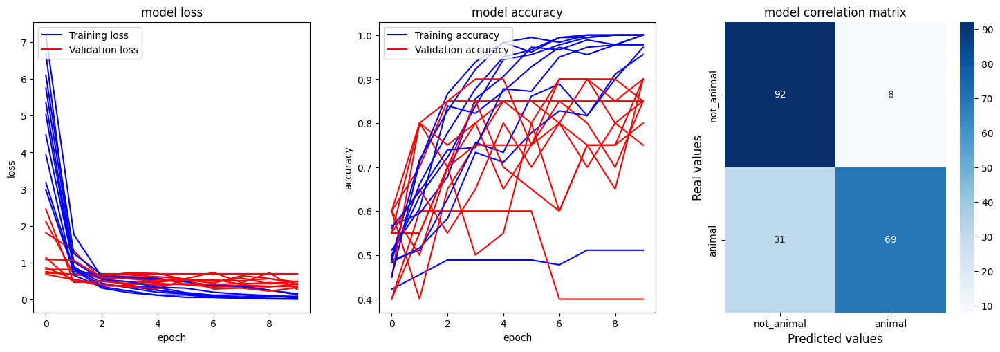

Accuracy: mean=80.500 std=14.221, n=10


In [ ]:
run_evaluation(define_model_baseline, X_tiger, y_tiger, n_folds=10, epochs=10, batch_size=16)

**Images d'éléphants**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 2s 35ms/step - loss: 3.2686 - accuracy: 0.6111 - val_loss: 1.8994 - val_accuracy: 0.7500
Epoch 2/10
12/12 [==============================] - 0s 19ms/step - loss: 0.8401 - accuracy: 0.7278 - val_loss: 0.5370 - val_accuracy: 0.7500
Epoch 3/10
12/12 [==============================] - 0s 28ms/step - loss: 0.2908 - accuracy: 0.8833 - val_loss: 0.5606 - val_accuracy: 0.8000
Epoch 4/10
12/12 [==============================] - 0s 21ms/step - loss: 0.1727 - accuracy: 0.9333 - val_loss: 0.5355 - val_accuracy: 0.7500
Epoch 5/10
12/12 [==============================] - 0s 23ms/step - loss: 0.1131 - accuracy: 0.9667 - val_loss: 0.4514 - val_accuracy: 0.8000
Epoch 6/10
12/12 [==============================] - 0s 20ms/step - loss: 0.0780 - accuracy: 0.9722 - val_loss: 0.6480 - val_accuracy: 0.7000
Epoch 7/10
12/12 [==============================] - 0s 17ms/step - loss: 0.0339 - accuracy: 1.0000 - val_loss: 0.4090 - val_accu

<ipython-input-5-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



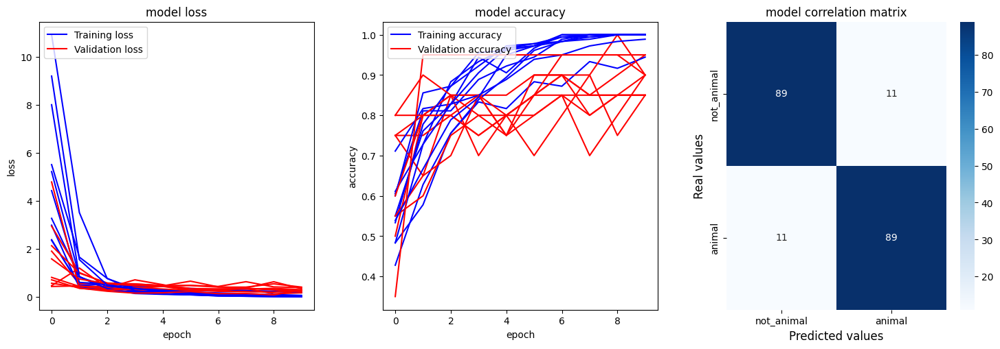

Accuracy: mean=89.000 std=3.742, n=10


In [ ]:
run_evaluation(define_model_baseline, X_elephant, y_elephant, n_folds=10, epochs=10, batch_size=16)

**Images de renards**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 1s 28ms/step - loss: 4.0890 - accuracy: 0.4778 - val_loss: 1.9741 - val_accuracy: 0.4000
Epoch 2/10
12/12 [==============================] - 0s 14ms/step - loss: 0.8293 - accuracy: 0.6333 - val_loss: 0.5611 - val_accuracy: 0.7000
Epoch 3/10
12/12 [==============================] - 0s 14ms/step - loss: 0.3859 - accuracy: 0.8444 - val_loss: 0.3249 - val_accuracy: 0.8500
Epoch 4/10
12/12 [==============================] - 0s 14ms/step - loss: 0.2147 - accuracy: 0.9444 - val_loss: 0.3077 - val_accuracy: 0.8500
Epoch 5/10
12/12 [==============================] - 0s 12ms/step - loss: 0.1030 - accuracy: 1.0000 - val_loss: 0.1710 - val_accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 13ms/step - loss: 0.0471 - accuracy: 1.0000 - val_loss: 0.2254 - val_accuracy: 0.9000
Epoch 7/10
12/12 [==============================] - 0s 12ms/step - loss: 0.0291 - accuracy: 1.0000 - val_loss: 0.0828 - val_accu

<ipython-input-5-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



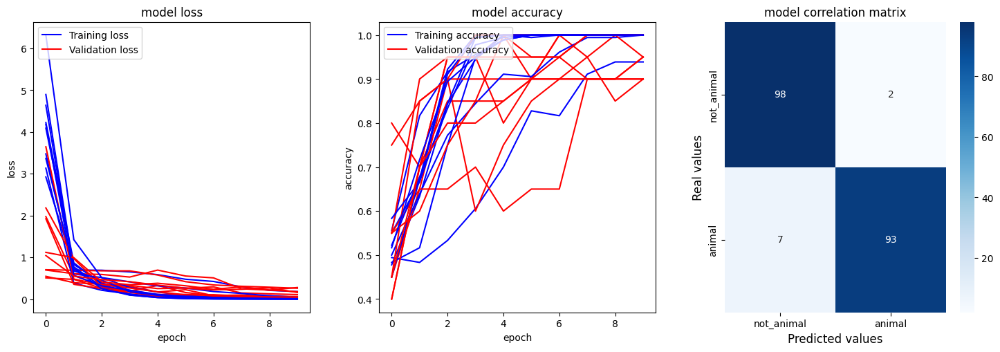

Accuracy: mean=95.500 std=4.153, n=10


In [ ]:
run_evaluation(define_model_baseline, X_fox, y_fox, n_folds=10, epochs=10, batch_size=16)

**Sauvegarde du modèle**

In [ ]:
# Par défaut on sauvegarde en utilisant le dataset des tigres
# save_model("modeleBaseline", define_model_baseline, X_tiger, y_tiger, epochs_data=10, batch_size_data=16)

Epoch 1/10
13/13 [==============================] - 1s 11ms/step - loss: 4.5688 - accuracy: 0.5150
Epoch 2/10
13/13 [==============================] - 0s 10ms/step - loss: 0.8168 - accuracy: 0.6350
Epoch 3/10
13/13 [==============================] - 0s 9ms/step - loss: 0.4439 - accuracy: 0.8200
Epoch 4/10
13/13 [==============================] - 0s 10ms/step - loss: 0.3414 - accuracy: 0.8600
Epoch 5/10
13/13 [==============================] - 0s 10ms/step - loss: 0.2294 - accuracy: 0.9050
Epoch 6/10
13/13 [==============================] - 0s 9ms/step - loss: 0.1342 - accuracy: 0.9700
Epoch 7/10
13/13 [==============================] - 0s 9ms/step - loss: 0.0644 - accuracy: 1.0000
Epoch 8/10
13/13 [==============================] - 0s 9ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 9/10
13/13 [==============================] - 0s 9ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 10/10
13/13 [==============================] - 0s 9ms/step - loss: 0.0120 - accuracy: 1.0000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



## 2. Spécification et amélioration du modèle *baseline*

### Modèle pour les tigres

**Définition du modèle**

In [ ]:
def define_model_tiger():
  model_tiger = Sequential()

  # Convolution and pooling
  model_tiger.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3), name="Conv2D_1", padding="same", strides=1))
  model_tiger.add(MaxPooling2D(pool_size=(2, 2), name="Maxpooling2D_1"))
  model_tiger.add(MaxPooling2D(pool_size=(2, 2), name="Maxpooling2D_2"))
  model_tiger.add(Conv2D(filters=48, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE/2, IMG_SIZE/2, 3), name="Conv2D_2", padding="same", strides=1))
  model_tiger.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE/4, IMG_SIZE/4, 3), name="Conv2D_3", padding="same", strides=1))

  # Flatten
  model_tiger.add(Flatten(name="flatten") )

  # Classification
  model_tiger.add(Dense(85, activation='relu'))
  model_tiger.add(Dense(2, activation='sigmoid'))

  model_tiger.compile(optimizer='adam', loss='sparse_categorical_crossentropy',metrics=['accuracy'])

  return model_tiger

In [ ]:
define_model_tiger().summary()

Model: "sequential_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 124, 124, 64)      1792      
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 62, 62, 64)        0         
 2D)                                                             
                                                                 
 Maxpooling2D_2 (MaxPooling  (None, 31, 31, 64)        0         
 2D)                                                             
                                                                 
 Conv2D_2 (Conv2D)           (None, 31, 31, 48)        27696     
                                                                 
 Conv2D_3 (Conv2D)           (None, 31, 31, 16)        6928      
                                                                 
 flatten (Flatten)           (None, 15376)           

**Images de tigres**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 2s 37ms/step - loss: 0.7046 - accuracy: 0.5444 - val_loss: 0.6915 - val_accuracy: 0.7000
Epoch 2/10
12/12 [==============================] - 0s 13ms/step - loss: 0.6566 - accuracy: 0.6444 - val_loss: 0.6611 - val_accuracy: 0.6500
Epoch 3/10
12/12 [==============================] - 0s 12ms/step - loss: 0.5248 - accuracy: 0.7667 - val_loss: 0.6388 - val_accuracy: 0.6500
Epoch 4/10
12/12 [==============================] - 0s 13ms/step - loss: 0.3433 - accuracy: 0.8500 - val_loss: 0.4667 - val_accuracy: 0.7500
Epoch 5/10
12/12 [==============================] - 0s 12ms/step - loss: 0.2226 - accuracy: 0.9278 - val_loss: 0.6836 - val_accuracy: 0.7000
Epoch 6/10
12/12 [==============================] - 0s 12ms/step - loss: 0.1988 - accuracy: 0.9056 - val_loss: 0.6614 - val_accuracy: 0.8500
Epoch 7/10
12/12 [==============================] - 0s 12ms/step - loss: 0.2992 - accuracy: 0.8611 - val_loss: 0.3426 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



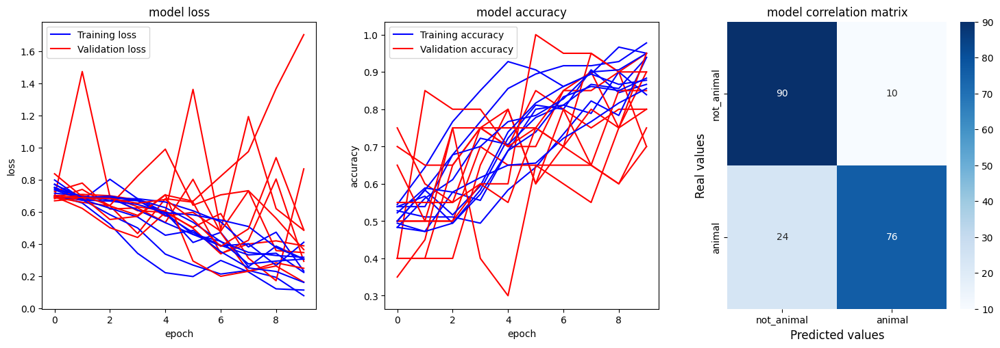

Accuracy: mean=83.000 std=9.000, n=10


In [ ]:
run_evaluation(define_model_tiger, X_tiger, y_tiger, n_folds=10, epochs=10, batch_size=16)

**Images d'éléphants**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 2s 29ms/step - loss: 0.7256 - accuracy: 0.5889 - val_loss: 0.5799 - val_accuracy: 0.7500
Epoch 2/10
12/12 [==============================] - 0s 14ms/step - loss: 0.5857 - accuracy: 0.7056 - val_loss: 0.5954 - val_accuracy: 0.7000
Epoch 3/10
12/12 [==============================] - 0s 14ms/step - loss: 0.4008 - accuracy: 0.8000 - val_loss: 1.8353 - val_accuracy: 0.4500
Epoch 4/10
12/12 [==============================] - 0s 13ms/step - loss: 0.6253 - accuracy: 0.7444 - val_loss: 0.3152 - val_accuracy: 0.8000
Epoch 5/10
12/12 [==============================] - 0s 13ms/step - loss: 0.4830 - accuracy: 0.7611 - val_loss: 0.3945 - val_accuracy: 0.7500
Epoch 6/10
12/12 [==============================] - 0s 14ms/step - loss: 0.3346 - accuracy: 0.8833 - val_loss: 0.3251 - val_accuracy: 0.7500
Epoch 7/10
12/12 [==============================] - 0s 14ms/step - loss: 0.3359 - accuracy: 0.8556 - val_loss: 0.6198 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



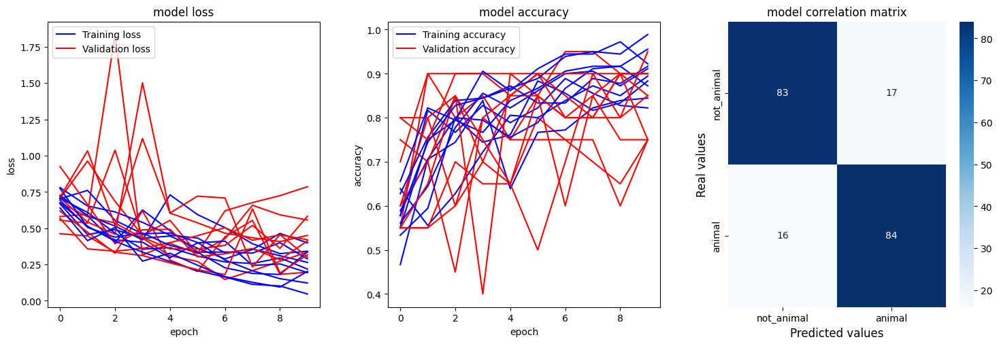

Accuracy: mean=83.500 std=7.433, n=10


In [ ]:
run_evaluation(define_model_tiger, X_elephant, y_elephant, n_folds=10, epochs=10, batch_size=16)

**Images de renards**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 2s 39ms/step - loss: 0.8089 - accuracy: 0.4778 - val_loss: 0.6906 - val_accuracy: 0.5500
Epoch 2/10
12/12 [==============================] - 0s 17ms/step - loss: 0.6879 - accuracy: 0.4944 - val_loss: 0.6532 - val_accuracy: 0.5500
Epoch 3/10
12/12 [==============================] - 0s 17ms/step - loss: 0.7102 - accuracy: 0.5611 - val_loss: 0.6953 - val_accuracy: 0.5500
Epoch 4/10
12/12 [==============================] - 0s 18ms/step - loss: 0.6866 - accuracy: 0.6056 - val_loss: 0.6971 - val_accuracy: 0.5000
Epoch 5/10
12/12 [==============================] - 0s 21ms/step - loss: 0.6665 - accuracy: 0.5944 - val_loss: 0.6310 - val_accuracy: 0.7500
Epoch 6/10
12/12 [==============================] - 0s 19ms/step - loss: 0.5763 - accuracy: 0.7111 - val_loss: 0.6696 - val_accuracy: 0.5500
Epoch 7/10
12/12 [==============================] - 0s 15ms/step - loss: 0.6067 - accuracy: 0.7111 - val_loss: 0.5699 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



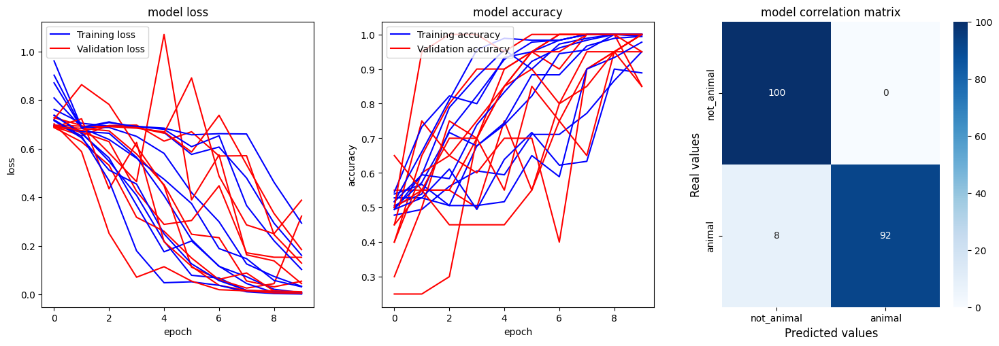

Accuracy: mean=96.000 std=5.831, n=10


In [ ]:
run_evaluation(define_model_tiger, X_fox, y_fox, n_folds=10, epochs=10, batch_size=16)

**Sauvegarde du modèle**

In [ ]:
# save_model("modeleTiger", define_model_tiger, X_tiger, y_tiger, epochs_data=10, batch_size_data=16)

Epoch 1/10
13/13 [==============================] - 2s 28ms/step - loss: 0.8425 - accuracy: 0.4700
Epoch 2/10
13/13 [==============================] - 0s 9ms/step - loss: 0.6930 - accuracy: 0.5000
Epoch 3/10
13/13 [==============================] - 0s 9ms/step - loss: 0.6916 - accuracy: 0.5350
Epoch 4/10
13/13 [==============================] - 0s 10ms/step - loss: 0.6912 - accuracy: 0.5900
Epoch 5/10
13/13 [==============================] - 0s 10ms/step - loss: 0.6627 - accuracy: 0.6350
Epoch 6/10
13/13 [==============================] - 0s 23ms/step - loss: 0.6328 - accuracy: 0.6600
Epoch 7/10
13/13 [==============================] - 0s 29ms/step - loss: 0.6248 - accuracy: 0.6300
Epoch 8/10
13/13 [==============================] - 0s 30ms/step - loss: 0.6086 - accuracy: 0.7250
Epoch 9/10
13/13 [==============================] - 0s 30ms/step - loss: 0.4795 - accuracy: 0.8350
Epoch 10/10
13/13 [==============================] - 0s 28ms/step - loss: 0.4183 - accuracy: 0.7950


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



### Modèle pour les éléphants

**Définition du modèle**

In [ ]:
def define_model_elephant():
  model_elephant = Sequential()

  # Convolution and pooling
  model_elephant.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3), name="Conv2D_1", padding="same", strides=1))
  model_elephant.add(MaxPooling2D(pool_size=(2, 2), name="Maxpooling2D_1"))
  model_elephant.add(Conv2D(filters=48, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE/2, IMG_SIZE/2, 3), name="Conv2D_2", padding="same", strides=1))
  #model_elephant.add(Dropout(0.1))
  model_elephant.add(MaxPooling2D(pool_size=(2, 2), name="Maxpooling2D_2"))
  #model_elephant.add(MaxPooling2D(pool_size=(2, 2), name="Maxpooling2D_3"))

  # Flatten
  model_elephant.add(Flatten(name="flatten") )

  # Classification
  model_elephant.add(Dense(100, activation='relu'))
  model_elephant.add(Dense(2, activation='softmax'))

  model_elephant.compile(optimizer='adam', loss='sparse_categorical_crossentropy',metrics=['accuracy'])

  return model_elephant

In [ ]:
define_model_elephant().summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 124, 124, 16)      448       
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 62, 62, 16)        0         
 2D)                                                             
                                                                 
 Conv2D_2 (Conv2D)           (None, 62, 62, 48)        6960      
                                                                 
 Maxpooling2D_2 (MaxPooling  (None, 31, 31, 48)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 46128)             0         
                                                                 
 dense_60 (Dense)            (None, 100)             

**Images de tigres**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 2s 36ms/step - loss: 2.3875 - accuracy: 0.4889 - val_loss: 0.6896 - val_accuracy: 0.6000
Epoch 2/10
12/12 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5500 - val_loss: 0.6880 - val_accuracy: 0.5500
Epoch 3/10
12/12 [==============================] - 0s 15ms/step - loss: 0.6807 - accuracy: 0.6000 - val_loss: 0.6551 - val_accuracy: 0.8000
Epoch 4/10
12/12 [==============================] - 0s 15ms/step - loss: 0.6214 - accuracy: 0.7222 - val_loss: 0.5780 - val_accuracy: 0.7500
Epoch 5/10
12/12 [==============================] - 0s 16ms/step - loss: 0.5767 - accuracy: 0.7056 - val_loss: 0.5255 - val_accuracy: 0.8000
Epoch 6/10
12/12 [==============================] - 0s 14ms/step - loss: 0.4817 - accuracy: 0.8111 - val_loss: 0.5699 - val_accuracy: 0.7000
Epoch 7/10
12/12 [==============================] - 0s 13ms/step - loss: 0.4607 - accuracy: 0.7611 - val_loss: 0.4864 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



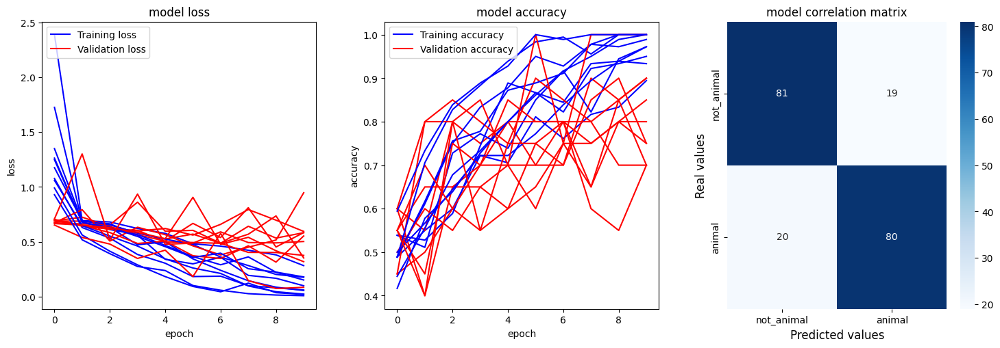

Accuracy: mean=80.500 std=9.862, n=10


In [ ]:
run_evaluation(define_model_elephant, X_tiger, y_tiger, n_folds=10, epochs=10, batch_size=16)

**Images d'éléphants**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 2s 28ms/step - loss: 1.7626 - accuracy: 0.4944 - val_loss: 0.4145 - val_accuracy: 0.8000
Epoch 2/10
12/12 [==============================] - 0s 13ms/step - loss: 0.5668 - accuracy: 0.7056 - val_loss: 0.3914 - val_accuracy: 0.9500
Epoch 3/10
12/12 [==============================] - 0s 13ms/step - loss: 0.4345 - accuracy: 0.7833 - val_loss: 0.2837 - val_accuracy: 0.9500
Epoch 4/10
12/12 [==============================] - 0s 13ms/step - loss: 0.3327 - accuracy: 0.8611 - val_loss: 0.1897 - val_accuracy: 0.9000
Epoch 5/10
12/12 [==============================] - 0s 13ms/step - loss: 0.3347 - accuracy: 0.8611 - val_loss: 0.1448 - val_accuracy: 0.9500
Epoch 6/10
12/12 [==============================] - 0s 11ms/step - loss: 0.2377 - accuracy: 0.9056 - val_loss: 0.1853 - val_accuracy: 0.9000
Epoch 7/10
12/12 [==============================] - 0s 12ms/step - loss: 0.1698 - accuracy: 0.9389 - val_loss: 0.1352 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



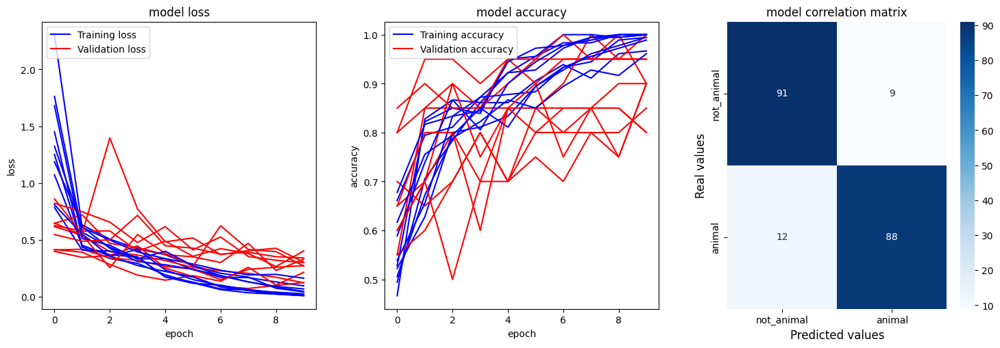

Accuracy: mean=89.500 std=6.103, n=10


In [ ]:
run_evaluation(define_model_elephant, X_elephant, y_elephant, n_folds=10, epochs=10, batch_size=16)

**Images de renards**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 1s 26ms/step - loss: 1.2592 - accuracy: 0.5667 - val_loss: 0.6565 - val_accuracy: 0.5500
Epoch 2/10
12/12 [==============================] - 0s 13ms/step - loss: 0.7016 - accuracy: 0.5611 - val_loss: 0.6047 - val_accuracy: 0.4500
Epoch 3/10
12/12 [==============================] - 0s 13ms/step - loss: 0.5225 - accuracy: 0.7667 - val_loss: 0.3584 - val_accuracy: 0.8500
Epoch 4/10
12/12 [==============================] - 0s 12ms/step - loss: 0.2880 - accuracy: 0.9278 - val_loss: 0.2604 - val_accuracy: 0.8500
Epoch 5/10
12/12 [==============================] - 0s 11ms/step - loss: 0.1445 - accuracy: 0.9722 - val_loss: 0.2117 - val_accuracy: 0.9000
Epoch 6/10
12/12 [==============================] - 0s 12ms/step - loss: 0.0695 - accuracy: 0.9889 - val_loss: 0.0981 - val_accuracy: 0.9500
Epoch 7/10
12/12 [==============================] - 0s 11ms/step - loss: 0.0249 - accuracy: 1.0000 - val_loss: 0.0730 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



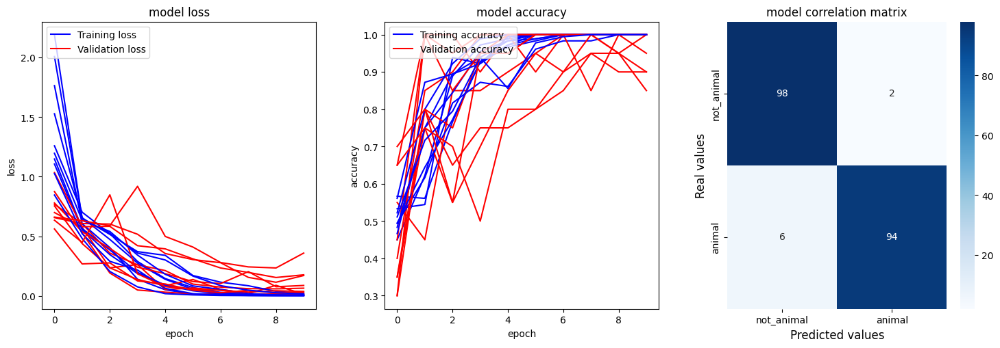

Accuracy: mean=96.000 std=5.385, n=10


In [ ]:
run_evaluation(define_model_elephant, X_fox, y_fox, n_folds=10, epochs=10, batch_size=16)

**Sauvegarde du modèle**

In [ ]:
# save_model("modeleElephant", define_model_elephant, X_elephant, y_elephant, epochs_data=10, batch_size_data=16)

Epoch 1/10
13/13 [==============================] - 1s 23ms/step - loss: 1.2442 - accuracy: 0.5500
Epoch 2/10
13/13 [==============================] - 0s 8ms/step - loss: 0.5751 - accuracy: 0.7800
Epoch 3/10
13/13 [==============================] - 0s 8ms/step - loss: 0.4509 - accuracy: 0.8400
Epoch 4/10
13/13 [==============================] - 0s 8ms/step - loss: 0.3542 - accuracy: 0.8400
Epoch 5/10
13/13 [==============================] - 0s 8ms/step - loss: 0.2820 - accuracy: 0.8850
Epoch 6/10
13/13 [==============================] - 0s 9ms/step - loss: 0.2051 - accuracy: 0.9300
Epoch 7/10
13/13 [==============================] - 0s 8ms/step - loss: 0.2566 - accuracy: 0.8750
Epoch 8/10
13/13 [==============================] - 0s 8ms/step - loss: 0.1762 - accuracy: 0.9450
Epoch 9/10
13/13 [==============================] - 0s 8ms/step - loss: 0.1140 - accuracy: 0.9600
Epoch 10/10
13/13 [==============================] - 0s 8ms/step - loss: 0.0924 - accuracy: 0.9800


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



### Modèle pour les renards

**Définition du modèle**

In [ ]:
def define_model_fox():
  model_fox = Sequential()

  # Convolution and pooling
  model_fox.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3), name="Conv2D_1", padding="same", strides=1))
  model_fox.add(MaxPooling2D(pool_size=(2, 2), name="Maxpooling2D_1"))
  model_fox.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3), name="Conv2D_3", padding="same", strides=1))
  model_fox.add(MaxPooling2D(pool_size=(2, 2), name="Maxpooling2D_2"))

  # Flatten
  model_fox.add(Flatten(name="flatten") )

  # Classification
  model_fox.add(Dense(85, activation='relu'))
  model_fox.add(Dense(2, activation='sigmoid'))

  model_fox.compile(optimizer='adam', loss='sparse_categorical_crossentropy',metrics=['accuracy'])

  return model_fox

In [ ]:
define_model_fox().summary()

Model: "sequential_185"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 124, 124, 32)      896       
                                                                 
 Maxpooling2D_1 (MaxPooling  (None, 62, 62, 32)        0         
 2D)                                                             
                                                                 
 Conv2D_3 (Conv2D)           (None, 62, 62, 32)        9248      
                                                                 
 Maxpooling2D_2 (MaxPooling  (None, 31, 31, 32)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 30752)             0         
                                                                 
 dense_370 (Dense)           (None, 85)             

**Images de tigres**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 2s 40ms/step - loss: 0.9133 - accuracy: 0.5778 - val_loss: 0.7801 - val_accuracy: 0.4000
Epoch 2/10
12/12 [==============================] - 0s 16ms/step - loss: 0.6833 - accuracy: 0.6222 - val_loss: 0.6773 - val_accuracy: 0.7000
Epoch 3/10
12/12 [==============================] - 0s 16ms/step - loss: 0.6474 - accuracy: 0.6222 - val_loss: 0.6230 - val_accuracy: 0.6000
Epoch 4/10
12/12 [==============================] - 0s 15ms/step - loss: 0.5914 - accuracy: 0.7833 - val_loss: 0.5609 - val_accuracy: 0.6000
Epoch 5/10
12/12 [==============================] - 0s 14ms/step - loss: 0.3981 - accuracy: 0.8444 - val_loss: 0.6190 - val_accuracy: 0.6500
Epoch 6/10
12/12 [==============================] - 0s 15ms/step - loss: 0.2891 - accuracy: 0.8833 - val_loss: 0.5328 - val_accuracy: 0.7500
Epoch 7/10
12/12 [==============================] - 0s 14ms/step - loss: 0.1787 - accuracy: 0.9611 - val_loss: 0.5186 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



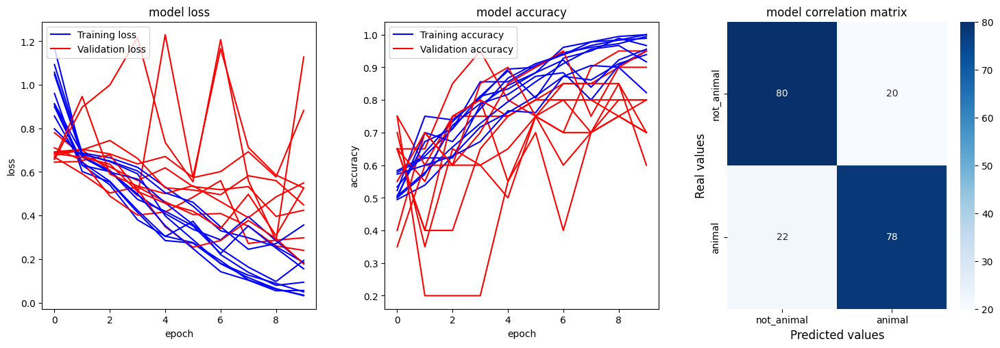

Accuracy: mean=79.000 std=11.136, n=10


In [ ]:
run_evaluation(define_model_fox, X_tiger, y_tiger, n_folds=10, epochs=10, batch_size=16)

**Images d'éléphants**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 1s 25ms/step - loss: 1.6490 - accuracy: 0.5944 - val_loss: 0.8522 - val_accuracy: 0.4000
Epoch 2/10
12/12 [==============================] - 0s 13ms/step - loss: 0.5845 - accuracy: 0.7278 - val_loss: 1.0960 - val_accuracy: 0.3000
Epoch 3/10
12/12 [==============================] - 0s 13ms/step - loss: 0.5664 - accuracy: 0.7167 - val_loss: 0.5080 - val_accuracy: 0.7000
Epoch 4/10
12/12 [==============================] - 0s 12ms/step - loss: 0.3732 - accuracy: 0.8278 - val_loss: 0.3005 - val_accuracy: 0.8000
Epoch 5/10
12/12 [==============================] - 0s 11ms/step - loss: 0.3119 - accuracy: 0.8500 - val_loss: 0.5727 - val_accuracy: 0.7000
Epoch 6/10
12/12 [==============================] - 0s 12ms/step - loss: 0.2607 - accuracy: 0.9000 - val_loss: 0.3919 - val_accuracy: 0.8000
Epoch 7/10
12/12 [==============================] - 0s 10ms/step - loss: 0.2146 - accuracy: 0.9056 - val_loss: 0.3321 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



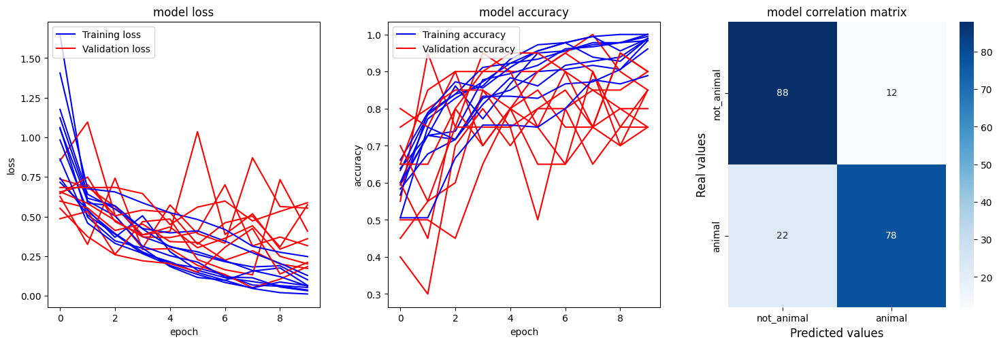

Accuracy: mean=83.000 std=6.000, n=10


In [ ]:
run_evaluation(define_model_fox, X_elephant, y_elephant, n_folds=10, epochs=10, batch_size=16)

**Images de renards**

(200, 124, 124, 3)
(200,)
Epoch 1/10
12/12 [==============================] - 2s 40ms/step - loss: 0.9342 - accuracy: 0.5111 - val_loss: 0.6484 - val_accuracy: 0.5500
Epoch 2/10
12/12 [==============================] - 0s 15ms/step - loss: 0.6127 - accuracy: 0.7111 - val_loss: 0.5530 - val_accuracy: 0.8500
Epoch 3/10
12/12 [==============================] - 0s 15ms/step - loss: 0.4216 - accuracy: 0.8556 - val_loss: 0.4148 - val_accuracy: 0.8500
Epoch 4/10
12/12 [==============================] - 0s 15ms/step - loss: 0.1997 - accuracy: 0.9889 - val_loss: 0.2422 - val_accuracy: 0.9000
Epoch 5/10
12/12 [==============================] - 0s 15ms/step - loss: 0.0876 - accuracy: 0.9944 - val_loss: 0.1676 - val_accuracy: 0.9000
Epoch 6/10
12/12 [==============================] - 0s 14ms/step - loss: 0.0536 - accuracy: 1.0000 - val_loss: 0.1247 - val_accuracy: 0.9000
Epoch 7/10
12/12 [==============================] - 0s 14ms/step - loss: 0.0199 - accuracy: 1.0000 - val_loss: 0.0703 - val_accu

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



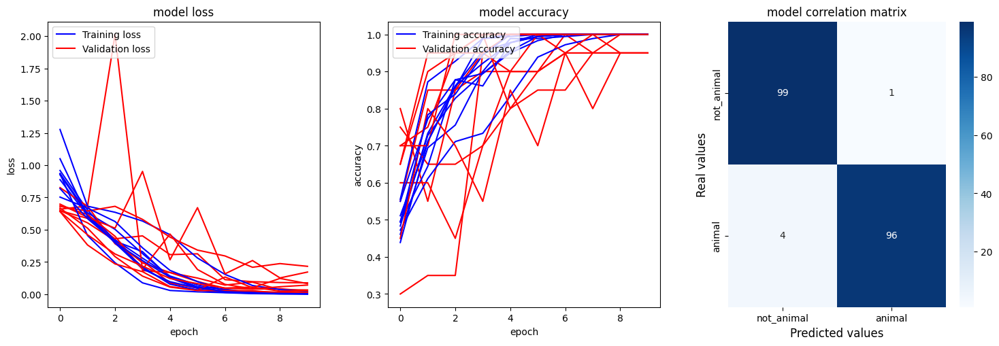

Accuracy: mean=97.500 std=2.500, n=10


In [ ]:
run_evaluation(define_model_fox, X_fox, y_fox, n_folds=10, epochs=10, batch_size=16)

**Sauvegarde du modèle**

In [ ]:
# save_model("modeleFox", define_model_fox, X_fox, y_fox, epochs_data=10, batch_size_data=16)

Epoch 1/10
13/13 [==============================] - 1s 25ms/step - loss: 0.8738 - accuracy: 0.5000
Epoch 2/10
13/13 [==============================] - 0s 9ms/step - loss: 0.4962 - accuracy: 0.8650
Epoch 3/10
13/13 [==============================] - 0s 12ms/step - loss: 0.2735 - accuracy: 0.9050
Epoch 4/10
13/13 [==============================] - 0s 14ms/step - loss: 0.0775 - accuracy: 0.9950
Epoch 5/10
13/13 [==============================] - 0s 16ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 6/10
13/13 [==============================] - 0s 17ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 7/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 8/10
13/13 [==============================] - 0s 13ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 9/10
13/13 [==============================] - 0s 8ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 10/10
13/13 [==============================] - 0s 8ms/step - loss: 9.1554e-04 - accuracy: 1.0000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



## 3. Génération de nouvelles données, amélioration des modèles spécialisés

**Constantes pour la génération**

In [ ]:
# Chemin vers les données augmentées
PATH_TO_AUGMENTED = "Data_Project/AugmentedTFE/"

**Fonctions de chargement, d'affichage et de génération**

In [24]:
# Chargement et normalisation des données par défaut
def load_data(animal_type): # animal_type *doit* être une chaîne de caractères
  animal_classes = [animal_type]
  X_train, y = create_X_y(PATH_TO_DATA, animal_classes)
  # Normalisation
  X = X_train.astype('float32')
  X = X / 255.0
  plot_examples(X_train, y)
  return X, y

# Visualisation des paramètres appliqués aux images via ImageDataGenerator
def preview_IDG_modifiers(idg_object, Xdata, Ydata, grid_length=3):
  # configuration du batch size et récupération d'un batch d'images
  for X_batch, y_batch in idg_object.flow(Xdata, Ydata, batch_size=(grid_length*grid_length), shuffle=True):
    # Affichage de grille d'images (3x3 par défaut)
    fig, ax = plt.subplots(grid_length, grid_length, sharex=True, sharey=True, figsize=(grid_length+1,grid_length+1))
    for i in range(grid_length):
      for j in range(grid_length):
        img = cv2.resize(X_batch[i*3+j], (IMG_SIZE, IMG_SIZE))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax[i][j].imshow(img)
    plt.show()
    break

# Génération de nouvelles images selon les paramètres d'un ImageDataGenerator
# Par défaut, on commence avec 100 images et on veut en avoir 1000
# => génération de 900 images supplémentaires
def generate_from_IDG(idg_object, Xdata, Ydata, output_folder, img_count=100, img_upperbound=1000):
  initial_img_count = img_count
  for X_batch, y_batch in idg_object.flow(Xdata, Ydata, batch_size=1, shuffle=False):
    # Resize for augmentation
    X_batch[0] = X_batch[0]*255
    X_batch = cv2.resize(X_batch[0], (IMG_SIZE, IMG_SIZE))
    cv2.imwrite(output_folder+f"/augmented_{img_count}.jpg", X_batch)
    img_count += 1
    if img_count >= img_upperbound:
      print('Generation of', (img_upperbound-initial_img_count), 'images in folder '+output_folder+' is done!')
      break

# Chargement et normalisation des données augmentées
def load_augmented_data(animal_type): # animal_type *doit* être une chaîne de caractères
  animal_classes = [animal_type]
  X_train, y = create_X_y(PATH_TO_AUGMENTED, animal_classes)
  # Normalisation
  X = X_train.astype('float32')
  X = X / 255.0
  plot_examples(X_train, y)
  return X, y

### Tigres

**Chargement du jeu de données**

In [ ]:
X_aug_tiger, Y_aug_tiger = load_data('tiger')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
X_aug_nTiger, Y_aug_nTiger = load_data('Tiger_negative_class')

Output hidden; open in https://colab.research.google.com to view.

**Instanciation et visualisation d'ImageDataGenerator**

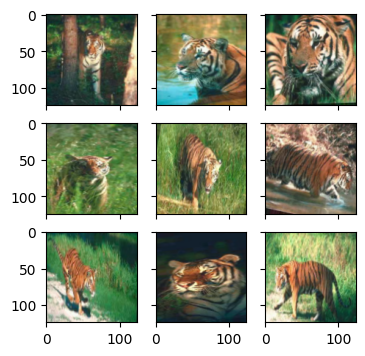

In [ ]:
datagen_T = ImageDataGenerator(rotation_range=15, width_shift_range=[-0.3, 1.0], height_shift_range=[-0.3, 1.0], zoom_range=[0.65, 1.0], horizontal_flip=True)
preview_IDG_modifiers(datagen_T, X_aug_tiger, Y_aug_tiger)

**Génération des images (ATTENTION : *TRES* COUTEUX - DECOMMENTER POUR EXECUTER)**

In [ ]:
# generate_from_IDG(datagen_T, X_aug_tiger, Y_aug_tiger, PATH_TO_AUGMENTED+'tiger')

Generation of 900 images in folder Data_Project/AugmentedTFE/tiger is done!


In [ ]:
# generate_from_IDG(datagen_T, X_aug_nTiger, Y_aug_nTiger, PATH_TO_AUGMENTED+'Tiger_negative_class')

Generation of 900 images in folder Data_Project/AugmentedTFE/Tiger_negative_class is done!


**Evaluation du meilleur modèle sur les tigres post augmentation**

In [ ]:
my_classes=['tiger','Tiger_negative_class']
X,y=create_X_y(PATH_TO_AUGMENTED,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
# On crée un df temporaire pour éviter un bug lors du plot
tempY = pd.DataFrame({'y': y})
sns.countplot(x='y', data=tempY)
plt.title("Nombre d'éléments par classe")
# affichage
plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

# Instanciation du dataframe des tigres
X_bigtiger = copy.deepcopy(X)
y_bigtiger = copy.deepcopy(y)

Output hidden; open in https://colab.research.google.com to view.

(1986, 124, 124, 3)
(1986,)
Epoch 1/10
112/112 [==============================] - 14s 16ms/step - loss: 0.5276 - accuracy: 0.7236 - val_loss: 0.4264 - val_accuracy: 0.8040
Epoch 2/10
112/112 [==============================] - 1s 10ms/step - loss: 0.3173 - accuracy: 0.8830 - val_loss: 0.4278 - val_accuracy: 0.8241
Epoch 3/10
112/112 [==============================] - 1s 10ms/step - loss: 0.1951 - accuracy: 0.9239 - val_loss: 0.3990 - val_accuracy: 0.8342
Epoch 4/10
112/112 [==============================] - 1s 10ms/step - loss: 0.1450 - accuracy: 0.9384 - val_loss: 0.2508 - val_accuracy: 0.9146
Epoch 5/10
112/112 [==============================] - 1s 10ms/step - loss: 0.1064 - accuracy: 0.9636 - val_loss: 0.1097 - val_accuracy: 0.9447
Epoch 6/10
112/112 [==============================] - 1s 10ms/step - loss: 0.1271 - accuracy: 0.9468 - val_loss: 0.0523 - val_accuracy: 0.9749
Epoch 7/10
112/112 [==============================] - 1s 10ms/step - loss: 0.0577 - accuracy: 0.9737 - val_loss: 

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



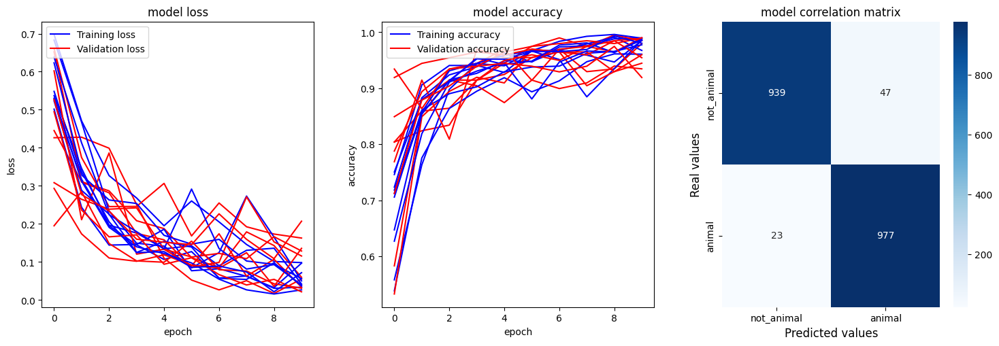

Accuracy: mean=96.475 std=2.459, n=10


In [ ]:
run_evaluation('modeleTiger.h5', X_bigtiger, y_bigtiger, n_folds=10, epochs=10, batch_size=16)

### Elephants

**Chargement du jeu de données**

In [ ]:
X_aug_elephant, Y_aug_elephant = load_data('elephant')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
X_aug_nElephant, Y_aug_nElephant = load_data('Elephant_negative_class')

Output hidden; open in https://colab.research.google.com to view.

**Instanciation et visualisation d'ImageDataGenerator**

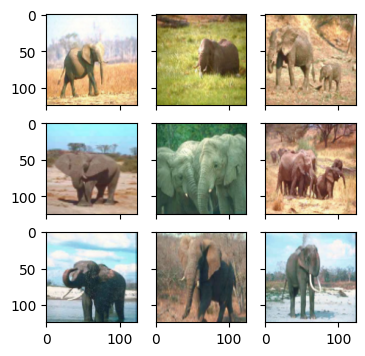

In [ ]:
datagen_E = ImageDataGenerator(width_shift_range=[-0.3, 1.0], height_shift_range=[-0.3, 1.0], zoom_range=[0.65, 1.0], horizontal_flip=True)
preview_IDG_modifiers(datagen_E, X_aug_elephant, Y_aug_elephant)

**Génération des images (ATTENTION : *TRES* COUTEUX - DECOMMENTER POUR EXECUTER)**

In [ ]:
# generate_from_IDG(datagen_E, X_aug_elephant, Y_aug_elephant, PATH_TO_AUGMENTED+"elephant")

Generation of 900 images in folder Data_Project/AugmentedTFE/elephant is done!


In [ ]:
# generate_from_IDG(datagen_E, X_aug_nElephant, Y_aug_nElephant, PATH_TO_AUGMENTED+"Elephant_negative_class")

Generation of 900 images in folder Data_Project/AugmentedTFE/Elephant_negative_class is done!


**Evaluation du meilleur modèle sur les éléphants post augmentation**

Nombre de données :  2000
Taille d'une image pour connaître l'input du réseau (124, 124, 3)
Distribution des labels dans le jeu d'apprentissage


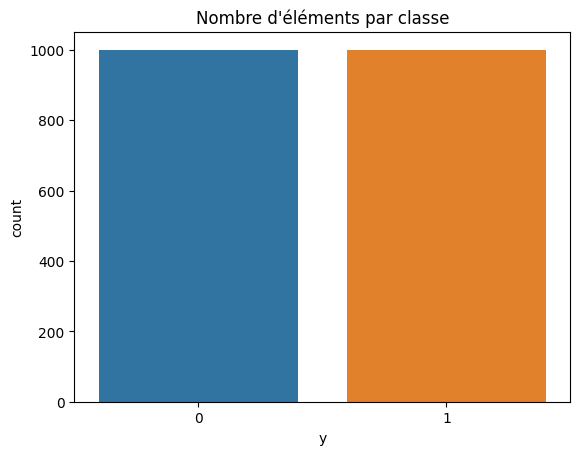

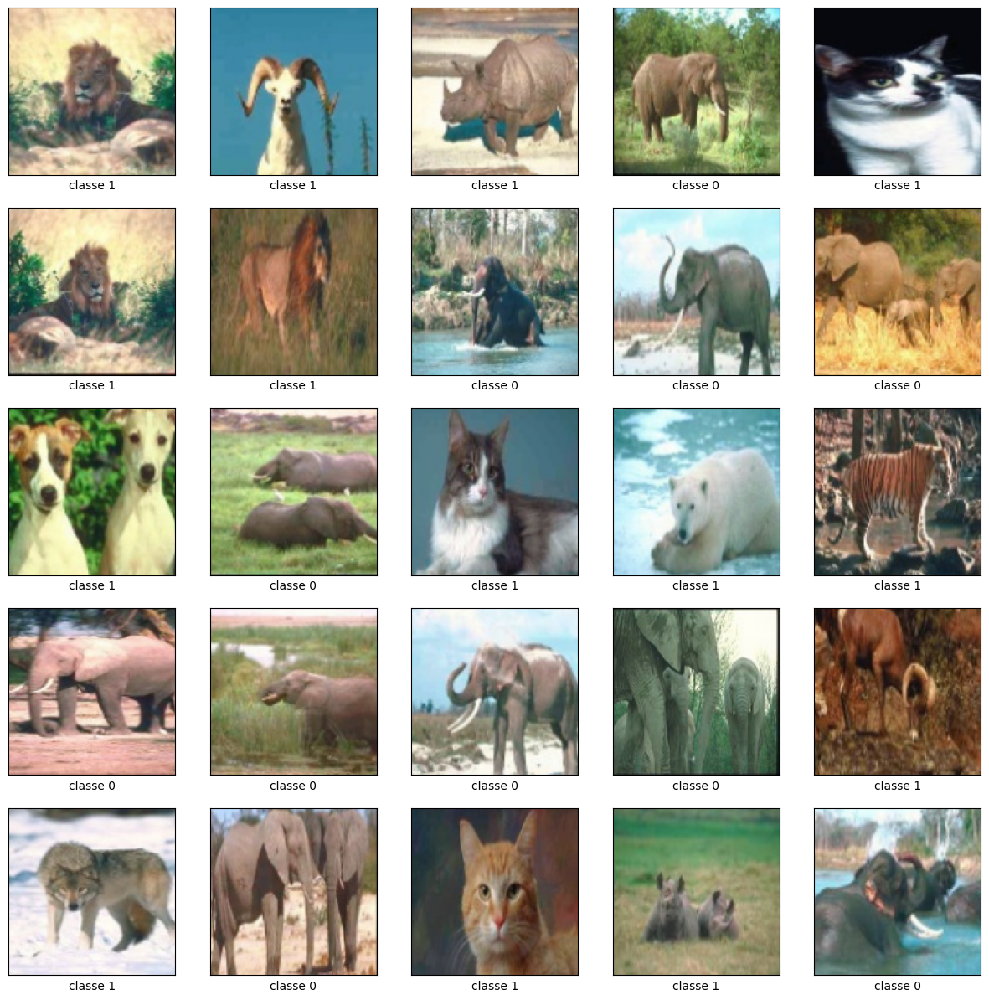

In [ ]:
my_classes=['elephant','Elephant_negative_class']
X,y=create_X_y(PATH_TO_AUGMENTED,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
# On crée un df temporaire pour éviter un bug lors du plot
tempY = pd.DataFrame({'y': y})
sns.countplot(x='y', data=tempY)
plt.title("Nombre d'éléments par classe")
# affichage
plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

# Instanciation du dataframe des tigres
X_bigelephant = copy.deepcopy(X)
y_bigelephant = copy.deepcopy(y)

(2000, 124, 124, 3)
(2000,)
Epoch 1/10
113/113 [==============================] - 3s 12ms/step - loss: 0.2240 - accuracy: 0.9072 - val_loss: 0.1706 - val_accuracy: 0.9300
Epoch 2/10
113/113 [==============================] - 1s 9ms/step - loss: 0.0956 - accuracy: 0.9644 - val_loss: 0.0782 - val_accuracy: 0.9700
Epoch 3/10
113/113 [==============================] - 1s 8ms/step - loss: 0.0491 - accuracy: 0.9850 - val_loss: 0.0472 - val_accuracy: 0.9900
Epoch 4/10
113/113 [==============================] - 1s 9ms/step - loss: 0.0171 - accuracy: 0.9961 - val_loss: 0.0369 - val_accuracy: 0.9850
Epoch 5/10
113/113 [==============================] - 1s 8ms/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 0.0216 - val_accuracy: 0.9900
Epoch 6/10
113/113 [==============================] - 1s 9ms/step - loss: 0.0094 - accuracy: 0.9983 - val_loss: 0.0389 - val_accuracy: 0.9800
Epoch 7/10
113/113 [==============================] - 1s 10ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.0313

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



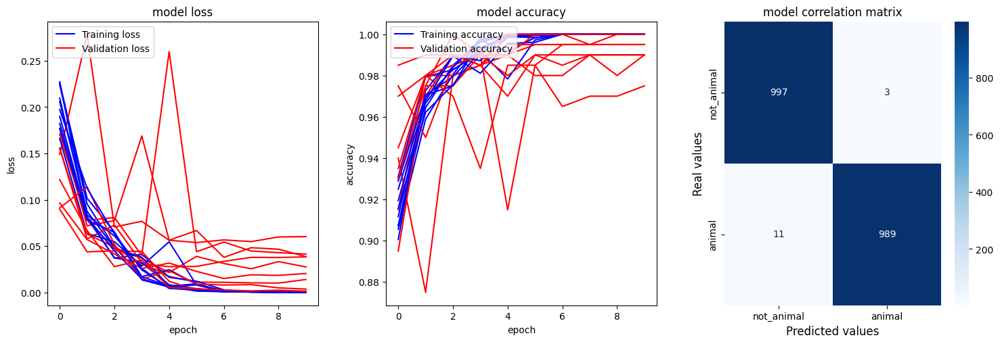

Accuracy: mean=99.300 std=0.714, n=10


In [ ]:
run_evaluation('modeleElephant.h5', X_bigelephant, y_bigelephant, n_folds=10, epochs=10, batch_size=16)

### Renards

**Chargement du jeu de données**

In [ ]:
X_aug_fox, Y_aug_fox = load_data('fox')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
X_aug_nFox, Y_aug_nFox = load_data('Fox_negative_class')

Output hidden; open in https://colab.research.google.com to view.

**Instanciation et visualisation d'ImageDataGenerator**

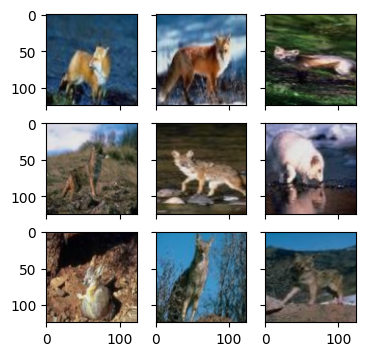

In [ ]:
datagen_F = ImageDataGenerator(rotation_range=15, width_shift_range=[-0.3, 1.0], height_shift_range=[-0.3, 1.0], zoom_range=[0.65, 1.0], horizontal_flip=True)
preview_IDG_modifiers(datagen_F, X_aug_fox, Y_aug_fox)

**Génération des images (ATTENTION : *TRES* COUTEUX - DECOMMENTER POUR EXECUTER)**

In [ ]:
# generate_from_IDG(datagen_F, X_aug_fox, Y_aug_fox, PATH_TO_AUGMENTED+"fox")

Generation of 900 images in folder Data_Project/AugmentedTFE/fox is done!


In [ ]:
# generate_from_IDG(datagen_F, X_aug_nFox, Y_aug_nFox, PATH_TO_AUGMENTED+"Fox_negative_class")

Generation of 900 images in folder Data_Project/AugmentedTFE/Fox_negative_class is done!


**Evaluation du meilleur modèle sur les renards post augmentation**

Nombre de données :  2000
Taille d'une image pour connaître l'input du réseau (124, 124, 3)
Distribution des labels dans le jeu d'apprentissage


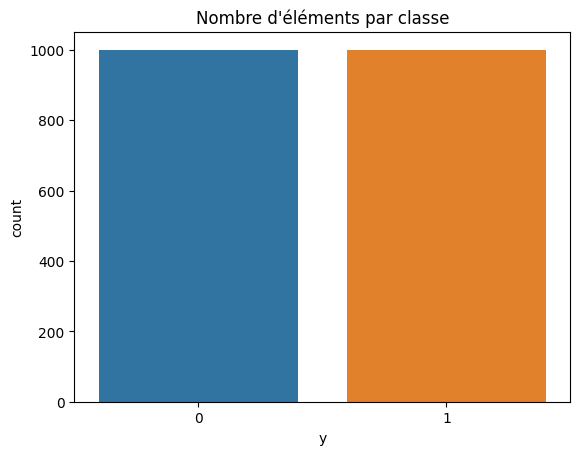

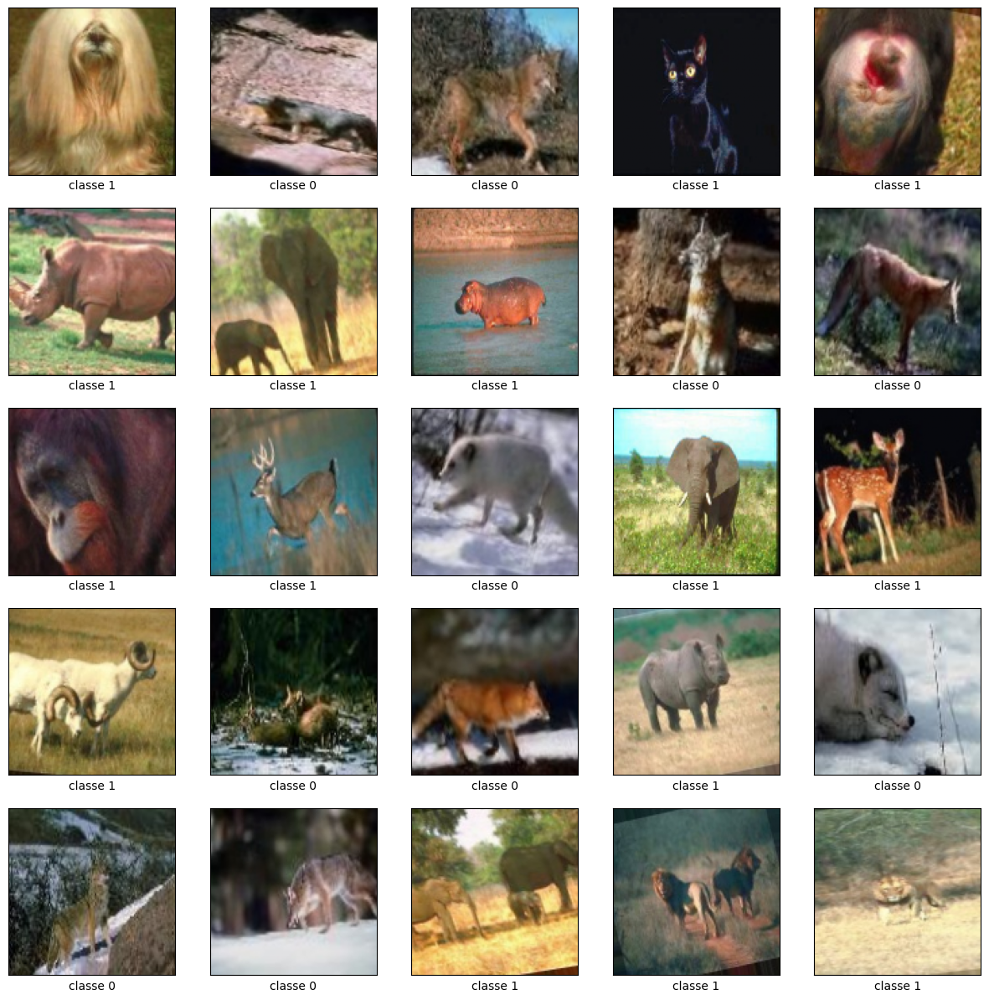

In [ ]:
my_classes=['fox','Fox_negative_class']
X,y=create_X_y(PATH_TO_AUGMENTED,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
# On crée un df temporaire pour éviter un bug lors du plot
tempY = pd.DataFrame({'y': y})
sns.countplot(x='y', data=tempY)
plt.title("Nombre d'éléments par classe")
# affichage
plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

# Instanciation du dataframe des tigres
X_bigfox = copy.deepcopy(X)
y_bigfox = copy.deepcopy(y)

(2000, 124, 124, 3)
(2000,)
Epoch 1/10
113/113 [==============================] - 4s 14ms/step - loss: 0.5037 - accuracy: 0.7428 - val_loss: 0.3658 - val_accuracy: 0.8350
Epoch 2/10
113/113 [==============================] - 1s 10ms/step - loss: 0.2501 - accuracy: 0.9033 - val_loss: 0.1859 - val_accuracy: 0.9350
Epoch 3/10
113/113 [==============================] - 1s 9ms/step - loss: 0.1374 - accuracy: 0.9522 - val_loss: 0.2208 - val_accuracy: 0.9100
Epoch 4/10
113/113 [==============================] - 1s 8ms/step - loss: 0.0705 - accuracy: 0.9767 - val_loss: 0.0648 - val_accuracy: 0.9900
Epoch 5/10
113/113 [==============================] - 1s 8ms/step - loss: 0.0748 - accuracy: 0.9750 - val_loss: 0.0677 - val_accuracy: 0.9750
Epoch 6/10
113/113 [==============================] - 1s 8ms/step - loss: 0.0121 - accuracy: 0.9983 - val_loss: 0.0134 - val_accuracy: 1.0000
Epoch 7/10
113/113 [==============================] - 1s 9ms/step - loss: 0.0609 - accuracy: 0.9794 - val_loss: 0.0892

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



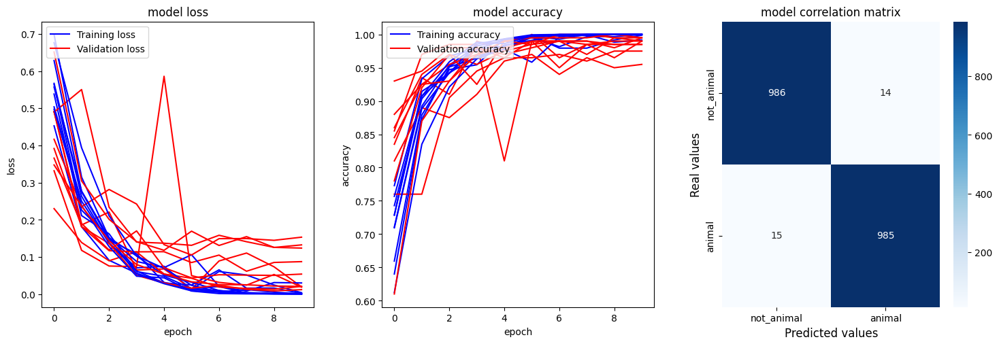

Accuracy: mean=98.550 std=1.172, n=10


In [ ]:
run_evaluation('modeleFox.h5', X_bigfox, y_bigfox, n_folds=10, epochs=10, batch_size=16)

### Evaluation du modèle baseline sur chaque classe d'animaux augmentée

(1986, 124, 124, 3)
(1986,)
Epoch 1/10
112/112 [==============================] - 2s 13ms/step - loss: 0.3410 - accuracy: 0.8584 - val_loss: 0.1889 - val_accuracy: 0.9447
Epoch 2/10
112/112 [==============================] - 1s 10ms/step - loss: 0.1374 - accuracy: 0.9519 - val_loss: 0.1605 - val_accuracy: 0.9196
Epoch 3/10
112/112 [==============================] - 1s 10ms/step - loss: 0.0715 - accuracy: 0.9793 - val_loss: 0.2828 - val_accuracy: 0.8744
Epoch 4/10
112/112 [==============================] - 1s 10ms/step - loss: 0.0264 - accuracy: 0.9978 - val_loss: 0.1393 - val_accuracy: 0.9296
Epoch 5/10
112/112 [==============================] - 1s 10ms/step - loss: 0.0114 - accuracy: 1.0000 - val_loss: 0.0510 - val_accuracy: 0.9849
Epoch 6/10
112/112 [==============================] - 1s 10ms/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 0.0485 - val_accuracy: 0.9849
Epoch 7/10
112/112 [==============================] - 1s 10ms/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 0

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



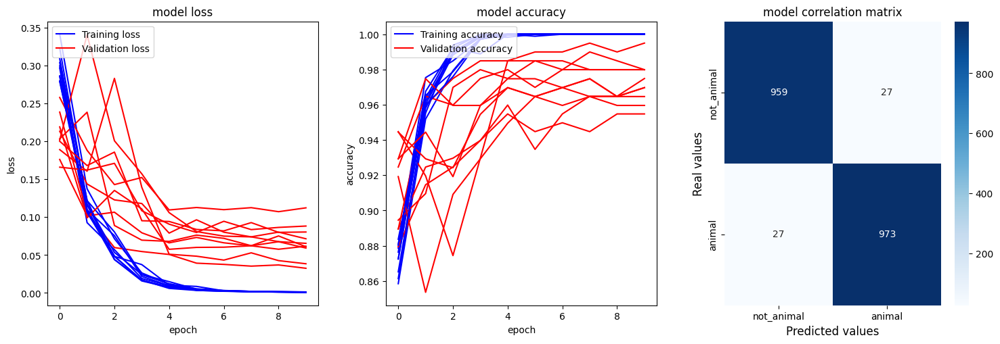

Accuracy: mean=97.280 std=1.110, n=10


In [ ]:
# TIGRES #
run_evaluation('modeleBaseline.h5', X_bigtiger, y_bigtiger, n_folds=10, epochs=10, batch_size=16)

(2000, 124, 124, 3)
(2000,)
Epoch 1/10
113/113 [==============================] - 11s 14ms/step - loss: 0.3938 - accuracy: 0.8400 - val_loss: 0.1633 - val_accuracy: 0.9450
Epoch 2/10
113/113 [==============================] - 1s 10ms/step - loss: 0.1446 - accuracy: 0.9478 - val_loss: 0.2392 - val_accuracy: 0.9000
Epoch 3/10
113/113 [==============================] - 1s 10ms/step - loss: 0.0979 - accuracy: 0.9650 - val_loss: 0.0669 - val_accuracy: 0.9850
Epoch 4/10
113/113 [==============================] - 1s 10ms/step - loss: 0.0488 - accuracy: 0.9894 - val_loss: 0.0482 - val_accuracy: 0.9850
Epoch 5/10
113/113 [==============================] - 1s 10ms/step - loss: 0.0227 - accuracy: 0.9978 - val_loss: 0.0443 - val_accuracy: 0.9850
Epoch 6/10
113/113 [==============================] - 1s 10ms/step - loss: 0.0117 - accuracy: 0.9983 - val_loss: 0.0797 - val_accuracy: 0.9700
Epoch 7/10
113/113 [==============================] - 1s 10ms/step - loss: 0.0168 - accuracy: 0.9956 - val_loss: 

<ipython-input-4-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



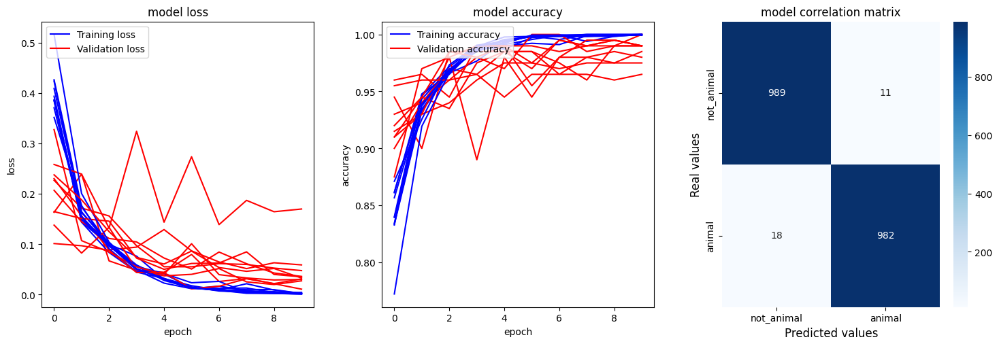

Accuracy: mean=98.550 std=0.934, n=10


In [ ]:
# ELEPHANTS #
run_evaluation('modeleBaseline.h5', X_bigelephant, y_bigelephant, n_folds=10, epochs=10, batch_size=16)

In [ ]:
# RENARDS #
run_evaluation('modeleBaseline.h5', X_bigfox, y_bigfox, n_folds=10, epochs=10, batch_size=16)

## 4. Transfer Learning appliqué aux données

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from keras.applications import MobileNetV2
from keras.layers import Dense, GlobalAveragePooling2D


def model_transfer_Learning():
  #base_model = VGG16(weights='imagenet', include_top=False, input_shape=(124, 124, 3))
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(124, 124, 3))

  for layer in base_model.layers:
      layer.trainable = False

  # Créer un nouveau modèle en ajoutant des couches personnalisées pour votre tâche spécifique
  model = models.Sequential()
  model.add(base_model)
  model.add(GlobalAveragePooling2D())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(2, activation='sigmoid'))  # Pour une classification binaire, utiliser 'sigmoid'


  # Compiler le modèle
  model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

  return model

### Tigres

(200, 124, 124, 3)
(200,)
Epoch 1/5
6/6 [==============================] - 5s 253ms/step - loss: 0.6123 - accuracy: 0.7389 - val_loss: 0.0734 - val_accuracy: 1.0000
Epoch 2/5
6/6 [==============================] - 0s 27ms/step - loss: 0.1176 - accuracy: 0.9444 - val_loss: 0.0413 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 25ms/step - loss: 0.0363 - accuracy: 0.9778 - val_loss: 0.0158 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0256 - accuracy: 0.9944 - val_loss: 0.0148 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 26ms/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 756ms/step


Epoch 1/5
6/6 [==============================] - 5s 285ms/step - loss: 1.2358 - accuracy: 0.6167 - val_loss: 0.6111 - val_accuracy: 0.7500
Epoch 2/5
6/6 [==============================] - 0s 38ms/step - loss: 0.3091 - accuracy: 0.8722 - val_loss: 0.2688 - val_accuracy: 0.8500
Epoch 3/5
6/6 [==============================] - 0s 35ms/step - loss: 0.1369 - accuracy: 0.9333 - val_loss: 0.3848 - val_accuracy: 0.8000
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0674 - accuracy: 0.9722 - val_loss: 0.2552 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0363 - accuracy: 0.9833 - val_loss: 0.2620 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 1s 731ms/step


Epoch 1/5
6/6 [==============================] - 4s 201ms/step - loss: 1.2505 - accuracy: 0.5889 - val_loss: 0.9835 - val_accuracy: 0.6500
Epoch 2/5
6/6 [==============================] - 0s 31ms/step - loss: 0.1933 - accuracy: 0.8944 - val_loss: 0.3530 - val_accuracy: 0.8000
Epoch 3/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0845 - accuracy: 0.9500 - val_loss: 0.5191 - val_accuracy: 0.9000
Epoch 4/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0317 - accuracy: 0.9944 - val_loss: 0.7247 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0256 - accuracy: 0.9944 - val_loss: 0.6349 - val_accuracy: 0.9000
accuracy 90.000
1/1 [==============================] - 1s 1s/step


Epoch 1/5
6/6 [==============================] - 4s 210ms/step - loss: 0.7813 - accuracy: 0.6944 - val_loss: 0.3335 - val_accuracy: 0.8500
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.1091 - accuracy: 0.9667 - val_loss: 0.3004 - val_accuracy: 0.9500
Epoch 3/5
6/6 [==============================] - 0s 31ms/step - loss: 0.0598 - accuracy: 0.9833 - val_loss: 0.1545 - val_accuracy: 0.9500
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0266 - accuracy: 0.9889 - val_loss: 0.1024 - val_accuracy: 0.9500
Epoch 5/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0096 - accuracy: 1.0000 - val_loss: 0.1451 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 1s 764ms/step


Epoch 1/5
6/6 [==============================] - 4s 225ms/step - loss: 0.7675 - accuracy: 0.6722 - val_loss: 0.4790 - val_accuracy: 0.6500
Epoch 2/5
6/6 [==============================] - 0s 38ms/step - loss: 0.1712 - accuracy: 0.9222 - val_loss: 0.5140 - val_accuracy: 0.8500
Epoch 3/5
6/6 [==============================] - 0s 36ms/step - loss: 0.0986 - accuracy: 0.9444 - val_loss: 0.2966 - val_accuracy: 0.9000
Epoch 4/5
6/6 [==============================] - 0s 32ms/step - loss: 0.0219 - accuracy: 0.9889 - val_loss: 0.1444 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 32ms/step - loss: 0.0408 - accuracy: 0.9833 - val_loss: 0.1819 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 1s 1s/step


Epoch 1/5
6/6 [==============================] - 4s 210ms/step - loss: 0.3590 - accuracy: 0.8111 - val_loss: 0.0260 - val_accuracy: 1.0000
Epoch 2/5
6/6 [==============================] - 0s 32ms/step - loss: 0.0372 - accuracy: 0.9944 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 30ms/step - loss: 0.0165 - accuracy: 0.9944 - val_loss: 0.0061 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 0.0090 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 0.0075 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 750ms/step


Epoch 1/5
6/6 [==============================] - 4s 273ms/step - loss: 0.4159 - accuracy: 0.8278 - val_loss: 0.3536 - val_accuracy: 0.9000
Epoch 2/5
6/6 [==============================] - 0s 38ms/step - loss: 0.0762 - accuracy: 0.9722 - val_loss: 0.3180 - val_accuracy: 0.9500
Epoch 3/5
6/6 [==============================] - 0s 36ms/step - loss: 0.0151 - accuracy: 0.9944 - val_loss: 0.3254 - val_accuracy: 0.9500
Epoch 4/5
6/6 [==============================] - 0s 33ms/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 0.2783 - val_accuracy: 0.9500
Epoch 5/5
6/6 [==============================] - 0s 38ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 0.2546 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 1s 1s/step


Epoch 1/5
6/6 [==============================] - 7s 195ms/step - loss: 0.7598 - accuracy: 0.7111 - val_loss: 0.3019 - val_accuracy: 0.9000
Epoch 2/5
6/6 [==============================] - 0s 31ms/step - loss: 0.2139 - accuracy: 0.9278 - val_loss: 0.3429 - val_accuracy: 0.9000
Epoch 3/5
6/6 [==============================] - 0s 31ms/step - loss: 0.0733 - accuracy: 0.9611 - val_loss: 0.4066 - val_accuracy: 0.8000
Epoch 4/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0749 - accuracy: 0.9556 - val_loss: 0.2485 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0136 - accuracy: 1.0000 - val_loss: 0.0863 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 2s 2s/step


Epoch 1/5
6/6 [==============================] - 8s 382ms/step - loss: 0.3481 - accuracy: 0.8556 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 2/5
6/6 [==============================] - 0s 55ms/step - loss: 0.0601 - accuracy: 0.9833 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 50ms/step - loss: 0.0128 - accuracy: 0.9944 - val_loss: 0.0132 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 43ms/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 0.0054 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 53ms/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 2s 2s/step


Epoch 1/5
6/6 [==============================] - 7s 526ms/step - loss: 1.0315 - accuracy: 0.6500 - val_loss: 0.0682 - val_accuracy: 1.0000
Epoch 2/5
6/6 [==============================] - 0s 49ms/step - loss: 0.1608 - accuracy: 0.9167 - val_loss: 0.0573 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 47ms/step - loss: 0.0677 - accuracy: 0.9722 - val_loss: 0.0157 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 46ms/step - loss: 0.0372 - accuracy: 0.9833 - val_loss: 0.0211 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 40ms/step - loss: 0.0169 - accuracy: 1.0000 - val_loss: 0.0156 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 827ms/step


<ipython-input-5-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



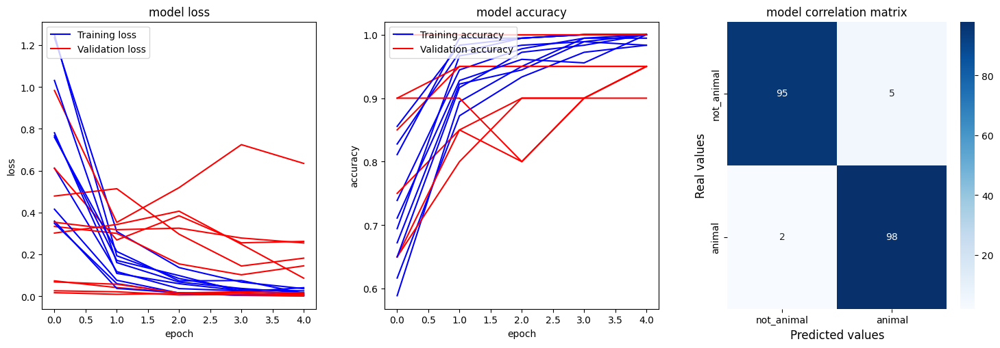

Accuracy: mean=96.500 std=3.202, n=10


In [ ]:
run_evaluation(model_transfer_Learning, X_tiger, y_tiger, n_folds=10, epochs=5, batch_size=32)

In [ ]:
# Par défaut on sauvegarde en utilisant le dataset des tigres
save_model("modele_transfer_learning_tiger", model_transfer_Learning, X_tiger, y_tiger, epochs_data=10, batch_size_data=16)

Epoch 1/10
13/13 [==============================] - 3s 16ms/step - loss: 0.4096 - accuracy: 0.8350
Epoch 2/10
13/13 [==============================] - 0s 14ms/step - loss: 0.0594 - accuracy: 0.9850
Epoch 3/10
13/13 [==============================] - 0s 13ms/step - loss: 0.0132 - accuracy: 1.0000
Epoch 4/10
13/13 [==============================] - 0s 13ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 5/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 6/10
13/13 [==============================] - 0s 11ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 7/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 8/10
13/13 [==============================] - 0s 11ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 9/10
13/13 [==============================] - 0s 11ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 10/10
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - accuracy: 1.0000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



### Elephants

(200, 124, 124, 3)
(200,)
Epoch 1/5
6/6 [==============================] - 4s 208ms/step - loss: 1.3907 - accuracy: 0.6056 - val_loss: 0.6044 - val_accuracy: 0.7500
Epoch 2/5
6/6 [==============================] - 0s 32ms/step - loss: 0.2610 - accuracy: 0.9056 - val_loss: 0.1736 - val_accuracy: 0.9500
Epoch 3/5
6/6 [==============================] - 0s 31ms/step - loss: 0.1896 - accuracy: 0.9500 - val_loss: 0.1594 - val_accuracy: 0.9000
Epoch 4/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0573 - accuracy: 0.9833 - val_loss: 0.1773 - val_accuracy: 0.8500
Epoch 5/5
6/6 [==============================] - 0s 31ms/step - loss: 0.0560 - accuracy: 0.9778 - val_loss: 0.1277 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 1s 1s/step


Epoch 1/5
6/6 [==============================] - 4s 220ms/step - loss: 0.9705 - accuracy: 0.6556 - val_loss: 0.3170 - val_accuracy: 0.7500
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.1888 - accuracy: 0.9278 - val_loss: 0.0291 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 31ms/step - loss: 0.0571 - accuracy: 0.9889 - val_loss: 0.1471 - val_accuracy: 0.9000
Epoch 4/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0388 - accuracy: 0.9889 - val_loss: 0.0279 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0139 - accuracy: 0.9944 - val_loss: 0.0157 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 816ms/step


Epoch 1/5
6/6 [==============================] - 5s 313ms/step - loss: 0.7122 - accuracy: 0.7444 - val_loss: 0.0636 - val_accuracy: 1.0000
Epoch 2/5
6/6 [==============================] - 0s 39ms/step - loss: 0.1633 - accuracy: 0.9444 - val_loss: 0.0359 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 36ms/step - loss: 0.0641 - accuracy: 0.9778 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 34ms/step - loss: 0.0267 - accuracy: 0.9944 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 32ms/step - loss: 0.0136 - accuracy: 1.0000 - val_loss: 0.0155 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 777ms/step


Epoch 1/5
6/6 [==============================] - 4s 198ms/step - loss: 0.6109 - accuracy: 0.7222 - val_loss: 0.2707 - val_accuracy: 0.9000
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.0799 - accuracy: 0.9611 - val_loss: 0.2485 - val_accuracy: 0.9500
Epoch 3/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0465 - accuracy: 0.9889 - val_loss: 0.3572 - val_accuracy: 0.9000
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0191 - accuracy: 0.9944 - val_loss: 0.2896 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0087 - accuracy: 1.0000 - val_loss: 0.3185 - val_accuracy: 0.9000
accuracy 90.000
1/1 [==============================] - 1s 749ms/step


Epoch 1/5
6/6 [==============================] - 5s 225ms/step - loss: 0.5441 - accuracy: 0.7667 - val_loss: 0.7628 - val_accuracy: 0.8500
Epoch 2/5
6/6 [==============================] - 0s 34ms/step - loss: 0.0953 - accuracy: 0.9722 - val_loss: 0.4473 - val_accuracy: 0.9500
Epoch 3/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0306 - accuracy: 0.9889 - val_loss: 0.5661 - val_accuracy: 0.9500
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0154 - accuracy: 0.9944 - val_loss: 0.6164 - val_accuracy: 0.9500
Epoch 5/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 0.5217 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 1s 747ms/step


Epoch 1/5
6/6 [==============================] - 4s 199ms/step - loss: 0.6752 - accuracy: 0.7611 - val_loss: 0.3252 - val_accuracy: 0.9000
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.3502 - accuracy: 0.8833 - val_loss: 0.2816 - val_accuracy: 0.9000
Epoch 3/5
6/6 [==============================] - 0s 28ms/step - loss: 0.1545 - accuracy: 0.9500 - val_loss: 0.3477 - val_accuracy: 0.9000
Epoch 4/5
6/6 [==============================] - 0s 26ms/step - loss: 0.0459 - accuracy: 0.9833 - val_loss: 0.1061 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 25ms/step - loss: 0.0267 - accuracy: 0.9944 - val_loss: 0.0811 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 1s 756ms/step


Epoch 1/5
6/6 [==============================] - 10s 499ms/step - loss: 1.0629 - accuracy: 0.6333 - val_loss: 0.3989 - val_accuracy: 0.8500
Epoch 2/5
6/6 [==============================] - 0s 37ms/step - loss: 0.2089 - accuracy: 0.9111 - val_loss: 0.3331 - val_accuracy: 0.8000
Epoch 3/5
6/6 [==============================] - 0s 31ms/step - loss: 0.1598 - accuracy: 0.9389 - val_loss: 0.0602 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 48ms/step - loss: 0.0947 - accuracy: 0.9722 - val_loss: 0.0386 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0405 - accuracy: 0.9833 - val_loss: 0.0690 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 826ms/step


Epoch 1/5
6/6 [==============================] - 7s 236ms/step - loss: 0.4960 - accuracy: 0.7833 - val_loss: 0.2961 - val_accuracy: 0.9000
Epoch 2/5
6/6 [==============================] - 0s 52ms/step - loss: 0.0780 - accuracy: 0.9833 - val_loss: 0.9785 - val_accuracy: 0.7000
Epoch 3/5
6/6 [==============================] - 0s 33ms/step - loss: 0.0565 - accuracy: 0.9778 - val_loss: 0.4766 - val_accuracy: 0.8000
Epoch 4/5
6/6 [==============================] - 0s 58ms/step - loss: 0.0229 - accuracy: 0.9889 - val_loss: 0.2296 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 52ms/step - loss: 0.0078 - accuracy: 1.0000 - val_loss: 0.4324 - val_accuracy: 0.8000
accuracy 80.000
1/1 [==============================] - 2s 2s/step


Epoch 1/5
6/6 [==============================] - 8s 407ms/step - loss: 0.5527 - accuracy: 0.7056 - val_loss: 0.0983 - val_accuracy: 0.9500
Epoch 2/5
6/6 [==============================] - 0s 45ms/step - loss: 0.0840 - accuracy: 0.9778 - val_loss: 0.0590 - val_accuracy: 0.9500
Epoch 3/5
6/6 [==============================] - 0s 46ms/step - loss: 0.0411 - accuracy: 0.9833 - val_loss: 0.0417 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 47ms/step - loss: 0.0280 - accuracy: 0.9889 - val_loss: 0.0762 - val_accuracy: 0.9500
Epoch 5/5
6/6 [==============================] - 0s 53ms/step - loss: 0.0033 - accuracy: 1.0000 - val_loss: 0.0404 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 1s/step


Epoch 1/5
6/6 [==============================] - 5s 285ms/step - loss: 0.8984 - accuracy: 0.6833 - val_loss: 0.7513 - val_accuracy: 0.6000
Epoch 2/5
6/6 [==============================] - 0s 39ms/step - loss: 0.1783 - accuracy: 0.9111 - val_loss: 0.0244 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 35ms/step - loss: 0.1132 - accuracy: 0.9667 - val_loss: 0.1050 - val_accuracy: 0.9500
Epoch 4/5
6/6 [==============================] - 0s 35ms/step - loss: 0.0386 - accuracy: 0.9944 - val_loss: 0.2455 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 36ms/step - loss: 0.0190 - accuracy: 1.0000 - val_loss: 0.1324 - val_accuracy: 0.9000
accuracy 90.000
1/1 [==============================] - 1s 785ms/step


<ipython-input-5-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



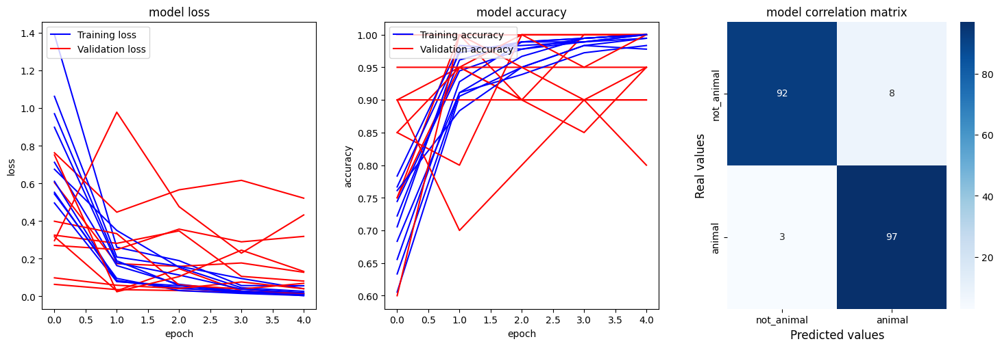

Accuracy: mean=94.500 std=6.103, n=10


In [ ]:
run_evaluation(model_transfer_Learning, X_elephant, y_elephant, n_folds=10, epochs=5, batch_size=32)

In [ ]:
# Par défaut on sauvegarde en utilisant le dataset des elephants
save_model("modele_transfer_learning_elephant", model_transfer_Learning, X_elephant, y_elephant, epochs_data=10, batch_size_data=16)

Epoch 1/10
13/13 [==============================] - 3s 16ms/step - loss: 0.5123 - accuracy: 0.8050
Epoch 2/10
13/13 [==============================] - 0s 15ms/step - loss: 0.0687 - accuracy: 0.9800
Epoch 3/10
13/13 [==============================] - 0s 13ms/step - loss: 0.0165 - accuracy: 1.0000
Epoch 4/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 5/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 6/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 7/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 8/10
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 9/10
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 10/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - accuracy: 1.0000


### Renards

(200, 124, 124, 3)
(200,)
Epoch 1/5
6/6 [==============================] - 6s 213ms/step - loss: 1.4381 - accuracy: 0.5444 - val_loss: 0.7928 - val_accuracy: 0.6000
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.2103 - accuracy: 0.8944 - val_loss: 0.1926 - val_accuracy: 0.9500
Epoch 3/5
6/6 [==============================] - 0s 31ms/step - loss: 0.0977 - accuracy: 0.9611 - val_loss: 0.0731 - val_accuracy: 0.9500
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0375 - accuracy: 0.9889 - val_loss: 0.1559 - val_accuracy: 0.9000
Epoch 5/5
6/6 [==============================] - 0s 26ms/step - loss: 0.0227 - accuracy: 1.0000 - val_loss: 0.0493 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 777ms/step


Epoch 1/5
6/6 [==============================] - 4s 200ms/step - loss: 0.6347 - accuracy: 0.7389 - val_loss: 0.1253 - val_accuracy: 0.9500
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.0492 - accuracy: 0.9833 - val_loss: 0.0135 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 34ms/step - loss: 0.0455 - accuracy: 0.9833 - val_loss: 0.0243 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 33ms/step - loss: 0.0194 - accuracy: 0.9944 - val_loss: 0.0413 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 35ms/step - loss: 0.0076 - accuracy: 1.0000 - val_loss: 0.0067 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 1s/step


Epoch 1/5
6/6 [==============================] - 4s 203ms/step - loss: 0.7264 - accuracy: 0.7278 - val_loss: 0.3182 - val_accuracy: 0.9000
Epoch 2/5
6/6 [==============================] - 0s 32ms/step - loss: 0.1592 - accuracy: 0.9444 - val_loss: 0.3403 - val_accuracy: 0.8500
Epoch 3/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0228 - accuracy: 0.9944 - val_loss: 0.1441 - val_accuracy: 0.9000
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0308 - accuracy: 0.9944 - val_loss: 0.0759 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 0.1662 - val_accuracy: 0.8500
accuracy 85.000
1/1 [==============================] - 1s 767ms/step


Epoch 1/5
6/6 [==============================] - 4s 259ms/step - loss: 0.4782 - accuracy: 0.7889 - val_loss: 0.0437 - val_accuracy: 1.0000
Epoch 2/5
6/6 [==============================] - 0s 37ms/step - loss: 0.0292 - accuracy: 1.0000 - val_loss: 0.0396 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 37ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 36ms/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 0.0209 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 35ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.0232 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 1s/step


Epoch 1/5
6/6 [==============================] - 4s 202ms/step - loss: 0.5665 - accuracy: 0.7056 - val_loss: 0.1531 - val_accuracy: 0.9500
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.0390 - accuracy: 0.9889 - val_loss: 0.0641 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0135 - accuracy: 1.0000 - val_loss: 0.0119 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 0.0072 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 0.0144 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 753ms/step


Epoch 1/5
6/6 [==============================] - 5s 290ms/step - loss: 1.5674 - accuracy: 0.5333 - val_loss: 1.0407 - val_accuracy: 0.6500
Epoch 2/5
6/6 [==============================] - 0s 40ms/step - loss: 0.2155 - accuracy: 0.9111 - val_loss: 0.1918 - val_accuracy: 0.9000
Epoch 3/5
6/6 [==============================] - 0s 39ms/step - loss: 0.1152 - accuracy: 0.9556 - val_loss: 0.1584 - val_accuracy: 0.9500
Epoch 4/5
6/6 [==============================] - 0s 37ms/step - loss: 0.0364 - accuracy: 0.9833 - val_loss: 0.3528 - val_accuracy: 0.8000
Epoch 5/5
6/6 [==============================] - 0s 35ms/step - loss: 0.0283 - accuracy: 0.9944 - val_loss: 0.1729 - val_accuracy: 0.9500
accuracy 95.000
1/1 [==============================] - 1s 757ms/step


Epoch 1/5
6/6 [==============================] - 5s 207ms/step - loss: 0.8836 - accuracy: 0.6722 - val_loss: 0.1260 - val_accuracy: 0.9500
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.0957 - accuracy: 0.9667 - val_loss: 0.0429 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0245 - accuracy: 1.0000 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 26ms/step - loss: 0.0129 - accuracy: 1.0000 - val_loss: 0.0178 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 25ms/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 0.0243 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 972ms/step


Epoch 1/5
6/6 [==============================] - 5s 202ms/step - loss: 1.2973 - accuracy: 0.5611 - val_loss: 0.5151 - val_accuracy: 0.7000
Epoch 2/5
6/6 [==============================] - 0s 33ms/step - loss: 0.2094 - accuracy: 0.9111 - val_loss: 0.2348 - val_accuracy: 0.8500
Epoch 3/5
6/6 [==============================] - 0s 30ms/step - loss: 0.0899 - accuracy: 0.9611 - val_loss: 0.0806 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0259 - accuracy: 1.0000 - val_loss: 0.0716 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0257 - accuracy: 1.0000 - val_loss: 0.0544 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 750ms/step


Epoch 1/5
6/6 [==============================] - 4s 195ms/step - loss: 0.5297 - accuracy: 0.7444 - val_loss: 0.0487 - val_accuracy: 1.0000
Epoch 2/5
6/6 [==============================] - 0s 32ms/step - loss: 0.0789 - accuracy: 0.9667 - val_loss: 0.0613 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0185 - accuracy: 1.0000 - val_loss: 0.0111 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 26ms/step - loss: 0.0051 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 26ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 0.0027 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 1s/step


Epoch 1/5
6/6 [==============================] - 4s 210ms/step - loss: 1.0054 - accuracy: 0.6278 - val_loss: 0.1461 - val_accuracy: 1.0000
Epoch 2/5
6/6 [==============================] - 0s 32ms/step - loss: 0.1132 - accuracy: 0.9556 - val_loss: 0.0344 - val_accuracy: 1.0000
Epoch 3/5
6/6 [==============================] - 0s 29ms/step - loss: 0.0379 - accuracy: 0.9889 - val_loss: 0.0095 - val_accuracy: 1.0000
Epoch 4/5
6/6 [==============================] - 0s 28ms/step - loss: 0.0120 - accuracy: 1.0000 - val_loss: 0.0059 - val_accuracy: 1.0000
Epoch 5/5
6/6 [==============================] - 0s 27ms/step - loss: 0.0067 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
accuracy 100.000
1/1 [==============================] - 1s 784ms/step


<ipython-input-5-d9cd447691d6>:28: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



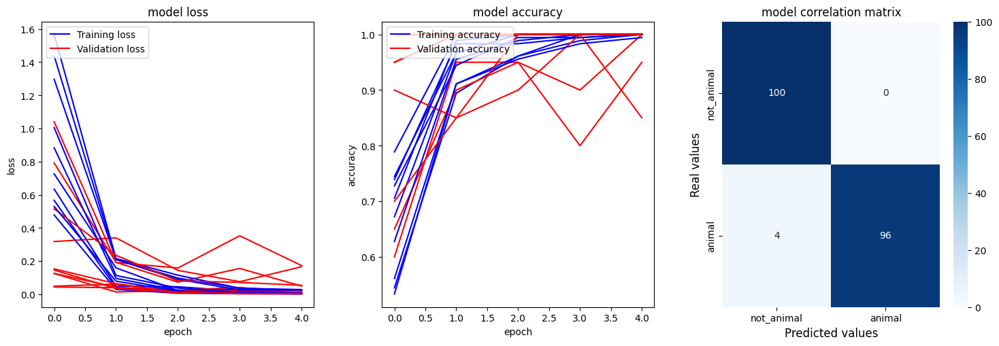

Accuracy: mean=98.000 std=4.583, n=10


In [ ]:
run_evaluation(model_transfer_Learning, X_fox, y_fox, n_folds=10, epochs=5, batch_size=32)

In [ ]:
# Par défaut on sauvegarde en utilisant le dataset des renards
save_model("modele_transfer_learning_elephant", model_transfer_Learning, X_fox, y_fox, epochs_data=10, batch_size_data=16)

Epoch 1/10
13/13 [==============================] - 4s 16ms/step - loss: 0.4273 - accuracy: 0.8400
Epoch 2/10
13/13 [==============================] - 0s 14ms/step - loss: 0.0525 - accuracy: 0.9800
Epoch 3/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 4/10
13/13 [==============================] - 0s 12ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 5/10
13/13 [==============================] - 0s 12ms/step - loss: 9.8601e-04 - accuracy: 1.0000
Epoch 6/10
13/13 [==============================] - 0s 11ms/step - loss: 8.3577e-04 - accuracy: 1.0000
Epoch 7/10
13/13 [==============================] - 0s 11ms/step - loss: 6.3609e-04 - accuracy: 1.0000
Epoch 8/10
13/13 [==============================] - 0s 11ms/step - loss: 5.4984e-04 - accuracy: 1.0000
Epoch 9/10
13/13 [==============================] - 0s 11ms/step - loss: 4.9913e-04 - accuracy: 1.0000
Epoch 10/10
13/13 [==============================] - 0s 12ms/step - loss: 4.5006e-04 - ac

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



NOTES : essayer InceptionV3 pour les éléphants, Xception pour les renards

## 5. *Generative Adversarial Network* (GAN) sur les renards

### Définitions

**Générateur**

In [14]:
def create_generator(latent_dim=100):
    model = Sequential()
    n_nodes = 31 * 31 * 3 * 128

    model.add(Dense(n_nodes,activation="relu",input_dim=latent_dim))
    model.add(Reshape((31, 31, 3*128)))

    model.add(UpSampling2D())
    model.add(Conv2D(3*128,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(UpSampling2D())
    model.add(Conv2D(3*128,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(3,kernel_size=3,padding="same"))
    model.add(Activation('sigmoid'))

    generator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)
    model.compile(loss='binary_crossentropy', optimizer=generator_optimizer, metrics=['accuracy'])
    return model

In [15]:
generator_model=create_generator()
generator_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 369024)            37271424  
                                                                 
 reshape (Reshape)           (None, 31, 31, 384)       0         
                                                                 
 up_sampling2d (UpSampling2  (None, 62, 62, 384)       0         
 D)                                                              
                                                                 
 conv2d (Conv2D)             (None, 62, 62, 384)       1327488   
                                                                 
 batch_normalization (Batch  (None, 62, 62, 384)       1536      
 Normalization)                                                  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 62, 62, 384)       0

**Discriminateur**

In [16]:
def create_discriminator():
  model = Sequential()
  model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=[124,124,3]))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.3))
  model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.3))
  model.add(Flatten())
  model.add(Dense(1, activation='sigmoid'))
  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [17]:
# On charge le modèle pour l'utiliser lors de l'entraînement aussi
model_discriminator=create_discriminator()
model_discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 62, 62, 64)        1792      
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 62, 62, 64)        0         
                                                                 
 dropout (Dropout)           (None, 62, 62, 64)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 31, 31, 64)        36928     
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 31, 31, 64)        0         
                                                                 
 dropout_1 (Dropout)         (None, 31, 31, 64)        0         
                                                                 
 flatten (Flatten)           (None, 61504)            

In [42]:
# Creation d'un jeu de données de vraies images
# les vraies images sont labélisées avec 1
def generate_real_samples(dataset, nb_images):
	# tirage aléatoire
	ix = randint(0, dataset.shape[0], nb_images)
	X = dataset[ix]
	# mettre 1 comme label de classe
	y = ones((nb_images, 1))
	return X, y

# Création d'un faux jeu de données
# elles seront labélisées avec 0
def generate_fake_samples(nb_images):
  # generation de nombres aléatoires entre 0 et 1
  # attention ici on simplifie en mettant la taille de l'image
  # normalement il faut prendre latent_dim
  X = np.random.rand(IMG_SIZE * IMG_SIZE * 3 * nb_images)
  # reshape en images couleur
  X = X.reshape((nb_images, IMG_SIZE, IMG_SIZE, 3))
  # mettre 0 comme label de classe
  y = zeros((nb_images, 1))
  return X, y

# Entraînement du discriminateur
def train_discriminator(model, dataset, epochs=100, batchsize=200):
  # on constitue un jeu de données de batchsize/2 images réelles et images fausses
	half_batch = int(batchsize / 2)
	# boucler sur les epochs
	for i in range(epochs):
		# sélection d'images réelles
		X_real, y_real = generate_real_samples(dataset, half_batch)
		# mettre à jour le discriminateur avec les images réelles
		_, real_acc = model.train_on_batch(X_real, y_real)
		# generation de fausses images
		X_fake, y_fake = generate_fake_samples(half_batch)
		# mise à jour du discriminateur avec de fausses images
		_, fake_acc = model.train_on_batch(X_fake, y_fake)
		# Affichage des résultats pour l'accuracy des vraies et des fausses
		print('>%d accuracy_real=%.0f%% accuracy_fake=%.0f%%' % (i+1, real_acc*100, fake_acc*100))

**GAN et fonctions préparatoires**


In [47]:
def create_gan(generator_model, discriminator_model):
  # mettre les poids du discriminateur non entrable
  discriminator_model.trainable = False
  # un seul modele qui regroupe
  model = Sequential()
  # ajout du générateur
  model.add(generator_model)
  # ajout du discriminateur
  model.add(discriminator_model)

  opt = Adam(learning_rate=0.0003, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt)
  return model

In [45]:
def generate_latent_points (latent_dim, nb_images):
  X_input = np.random.randn(latent_dim * nb_images)
  X_input = X_input.reshape(nb_images, latent_dim)
  return X_input

def generate_fake_samples_for_generator(generator_model, latent_dim, nb_images):
  # generation des points
  X_input = generate_latent_points (latent_dim,nb_images)
  # prediction de la sortie du générateur
  X = generator_model.predict(X_input)
  # A ce niveau on considère que les images sont fausses
  # donc on met 0 comme label.
  y = zeros((nb_images, 1))
  return X, y

def plot_and_save_generatedimages(generated_images, epoch, nb_images=10):
	# Affichage des images
	for i in range(nb_images * nb_images):
		pyplot.subplot(nb_images, nb_images, 1 + i)
		pyplot.axis('off')
		pyplot.imshow(generated_images[i, :, :])
	# sauvegarde de l'image
	filename = PATH_TO_MODELS+'generated_plot_FoxCNN_withGAN%03d.png' % epoch
	pyplot.savefig(filename)
	pyplot.close()

def evaluate_model (dataset, epoch, generator_model, discriminator_model, latent_dim, nb_images=100, save_model=True):
  # récupération de vraies images pour le discriminateur
  X_real, y_real = generate_real_samples(dataset, nb_images)
  # Evaluation de l'accuracy pour le discriminateur
  _, acc_real = discriminator_model.evaluate(X_real, y_real, verbose=0)

  # génération de fausses images pour le générateur et donc le gan
  X_fake, y_fake = generate_fake_samples_for_generator(generator_model, latent_dim, nb_images)
  # Evaluation du discriminateur avec des fausses images
  _, acc_fake = discriminator_model.evaluate(X_fake, y_fake, verbose=0)

  print ('Accuracy reélle : %.0f%%, fausse : %.0f%%' % (acc_real*100, acc_fake*100))

  plot_and_save_generatedimages(X_fake, epoch)
  if save_model==True:
    # sauvegarde du generateur pour un autre usage
    filename = PATH_TO_MODELS+'generator_model_FoxMNIST%03d.h5' % epoch
    generator_model.save(filename)

In [46]:
# Entraînement du générateur et du discriminateur
def train(generator_model, discriminator_model, gan_model, dataset, latent_dim, epochs=100, batchsize=256):
  # Pour déterminer combien il y aura de batchs analysés à chaque epoch
  batches_per_epoch = int(dataset.shape[0] / batchsize)

  # pour récupérer le même nombre d'images fausses et vraies
  half_batch = int(batchsize / 2)

  for i in range(epochs):
    # parcours des batches pour chaque pas d'epoch
    for j in range(batches_per_epoch):

      # PARTIE DISCRIMINATOR
      #tirage aléatoire de half_batch images vraies
      X_real, y_real = generate_real_samples(dataset, half_batch)
      # generation de half_size fausses images
      X_fake, y_fake = generate_fake_samples_for_generator(generator_model, latent_dim, half_batch)
      # vstack permet de concaténer les vraies et fausses images dans X (resp. dans y)
      # on aurait pu utiliser np.concatenate (np.concatenate([X_real, X_fake]))
      X, y = vstack((X_real, X_fake)), vstack((y_real, y_fake))

      # la ligne suivante permet au discriminateur de mettre à jour ses poids
      # attention dans le GAN il ne peut pas aprendre donc il ne peut le faire qu'ici
      discriminator_loss,_  = discriminator_model.train_on_batch(X, y)

      # PARTIE GENERATOR ET DONC DE L'ENTREE DU GAN
      # Création des points comme entrée du générateur
      #
      X_for_gan = generate_latent_points(latent_dim, batchsize)
      # On met un 1 pour les labels des fausses images pour faire croire au discriminateur
      # qu'il s'agit de vraies images
      y_for_gan = ones((batchsize, 1))

      # mise à jour des poids du générateur par propagation de l'esseur
      # du discriminateur
      gan_loss = gan_model.train_on_batch(X_for_gan, y_for_gan)
			# Affichage des pertes
      print('epoch %d - batch %d/%d, discriminator_loss=%.3f, generator_loss=%.3f'%(i+1, j+1, batches_per_epoch, discriminator_loss, gan_loss))

    # Toutes les 20 epochs evaluation du modèle et sauvegarde du générateur
    if i==99:
        evaluate_model (dataset, i+1, generator_model, discriminator_model, latent_dim)


In [48]:
# creation du générateur
generator_model = create_generator(latent_dim=100)
# creation du discriminateur
discriminator_model = create_discriminator()

# creation du GAN
gan_model = create_gan(generator_model, discriminator_model)
gan_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_2 (Sequential)   (None, 124, 124, 3)       39939843  
                                                                 
 sequential_3 (Sequential)   (None, 1)                 100225    
                                                                 
Total params: 40040068 (152.74 MB)
Trainable params: 39938307 (152.35 MB)
Non-trainable params: 101761 (397.50 KB)
_________________________________________________________________


### Entraînement

In [43]:
# chargement des données augmentées car ce sont les meilleures
fox_dataset, _ = load_data('fox')

# lancement de l'entrainement du discriminateur
train_discriminator(model_discriminator, fox_dataset, epochs=100, batchsize=200)

Output hidden; open in https://colab.research.google.com to view.

**GAN**

In [49]:
# Entraînement du modèle
# ATTENTION : TRES COUTEUX. PAS DE BETISES.
# train(generator_model, discriminator_model, gan_model, fox_dataset, latent_dim=100, epochs=100, batchsize=10)

1/1 [==============================] - 2s 2s/step
epoch 1 - batch 1/10, discriminator_loss=0.665, generator_loss=0.865
1/1 [==============================] - 0s 108ms/step
epoch 1 - batch 2/10, discriminator_loss=0.724, generator_loss=0.827
1/1 [==============================] - 0s 64ms/step
epoch 1 - batch 3/10, discriminator_loss=0.695, generator_loss=0.701
1/1 [==============================] - 0s 79ms/step
epoch 1 - batch 4/10, discriminator_loss=0.709, generator_loss=0.424
1/1 [==============================] - 0s 56ms/step
epoch 1 - batch 5/10, discriminator_loss=0.688, generator_loss=0.390
1/1 [==============================] - 0s 25ms/step
epoch 1 - batch 6/10, discriminator_loss=0.738, generator_loss=0.349
1/1 [==============================] - 0s 45ms/step
epoch 1 - batch 7/10, discriminator_loss=0.691, generator_loss=0.267
1/1 [==============================] - 0s 28ms/step
epoch 1 - batch 8/10, discriminator_loss=0.680, generator_loss=0.329
1/1 [============================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



### Génération d'image post entraînement

In [51]:
model = load_model(PATH_TO_MODELS+'generator_model_FoxMNIST100.h5')

1/1 [==============================] - 0s 30ms/step


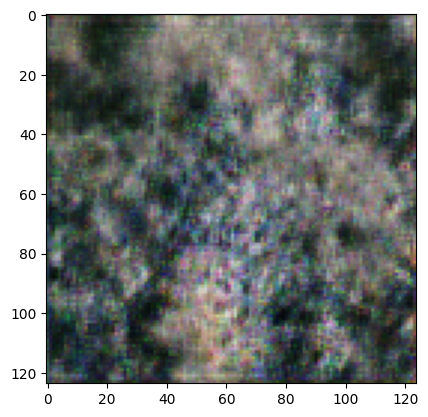

In [90]:
# Création d'un vecteur aléatoire de taille latent_dim
latent_points = generate_latent_points(100, 1)
generated_image = model.predict(latent_points)
plt.imshow (generated_image[0, :, :])

NOTES : REFAIRE LE MÊME ENTRAÎNEMENT AVEC RENARDS AUGMENTES??

## 6. Affichage des sorties de notre modèle le plus complexe (à déterminer)

Pour l'instant, le modèle le plus complexe que nous avons est le modèle spécialisé sur les tigres avec 8 couches et 1343633 paramètres.

## 7. (Optionnel) Coloration d'images via autoencodeurs sur les tigres

**Récupération de nos meilleures données, les tigres augmentés**

In [65]:
filenames = np.array(glob(os.path.join(PATH_TO_AUGMENTED+'/tiger', '*.jpg')))
NUM_IMAGES = len(filenames)
print("Total number of images : " + str(NUM_IMAGES))

INPUT_DIM = (128,128,3)
BATCH_SIZE = 10
Z_DIM = 200

data_flow = ImageDataGenerator(rescale=1./255).flow_from_directory(PATH_TO_AUGMENTED,
                                                                  classes=['tiger'],
                                                                   target_size = INPUT_DIM[:2],
                                                                   batch_size = BATCH_SIZE,
                                                                   shuffle = True,
                                                                   seed=42,
                                                                   class_mode = 'input'
                                                                   )

Total number of images : 986
Found 986 images belonging to 1 classes.


**Définition de l'auto-encodeur**

In [70]:
def build_encoder(input_dim, output_dim):

  global K
  K.clear_session()

  # entrée du modèle
  encoder_input = Input(shape = input_dim, name = 'encoder_input')
  x = encoder_input

  # Convolution 1
  x= Conv2D(filters = 32,
            kernel_size = 3,
            strides = 2,
            padding = 'same', name = 'encoder_conv_1')(x)
  # Activation
  x = LeakyReLU()(x)

  # Convolution 2
  x= Conv2D(filters = 64,
            kernel_size = 3,
            strides = 2,
            padding = 'same', name = 'encoder_conv_2')(x)
  # Activation
  x = LeakyReLU()(x)

  # Convolution 3
  x= Conv2D(filters = 64,
            kernel_size = 3,
            strides = 2,
            padding = 'same', name = 'encoder_conv_3')(x)
  # Activation
  x = LeakyReLU()(x)

   # Convolution 4
  x= Conv2D(filters = 64,
            kernel_size = 3,
            strides = 2,
            padding = 'same', name = 'encoder_conv_4')(x)
  # Activation
  x = LeakyReLU()(x)


  # Forme de l'entrée (que l'on renverra)
  shape_before_flattening = K.int_shape(x)[1:]

  # Aplatissement
  x = Flatten()(x)

  # Sortie de l'encodeur
  encoder_output = Dense(output_dim, name = 'encoder_output')(x)

  return encoder_input, encoder_output, shape_before_flattening, Model(encoder_input, encoder_output)

In [71]:
encoder_input, encoder_output,  shape_before_flattening, encoder  = build_encoder(input_dim = INPUT_DIM,
                                    output_dim = Z_DIM,
                                    )

encoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_input (InputLayer)  [(None, 128, 128, 3)]     0         
                                                                 
 encoder_conv_1 (Conv2D)     (None, 64, 64, 32)        896       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 32)        0         
                                                                 
 encoder_conv_2 (Conv2D)     (None, 32, 32, 64)        18496     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 encoder_conv_3 (Conv2D)     (None, 16, 16, 64)        36928     
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 16, 16, 64)        0     

In [72]:
def build_decoder(input_dim, shape_before_flattening):
  # Entrée du modèle
  decoder_input = Input(shape = (input_dim,) , name = 'decoder_input')

  # Image miroir de l'encodeur
  x = Dense(np.prod(shape_before_flattening))(decoder_input)
  x = Reshape(shape_before_flattening)(x)

  # Conv2DTranspose 1
  x = Conv2DTranspose(filters = 64,
                  kernel_size = 3,
                  strides = 2,
                  padding = 'same',
                  name = 'decoder_conv_1'
                  )(x)
  # Activation
  x = LeakyReLU()(x)

  # Conv2DTranspose 2
  x = Conv2DTranspose(filters = 64,
                  kernel_size = 3,
                  strides = 2,
                  padding = 'same',
                  name = 'decoder_conv_2'
                  )(x)
  # Activation
  x = LeakyReLU()(x)

  # Conv2DTranspose 3
  x = Conv2DTranspose(filters = 32,
                  kernel_size = 3,
                  strides = 2,
                  padding = 'same',
                  name = 'decoder_conv_3'
                  )(x)
  # Activation
  x = LeakyReLU()(x)

  # Conv2DTranspose 4
  x = Conv2DTranspose(filters = 3,
                  kernel_size = 3,
                  strides = 2,
                  padding = 'same',
                  name = 'decoder_conv_4'
                  )(x)
  # Activation
  x = Activation('sigmoid')(x)

  # Sortie du décodeur
  decoder_output = x

  return decoder_input, decoder_output, Model(decoder_input, decoder_output)

In [73]:
decoder_input, decoder_output, decoder = build_decoder(input_dim = Z_DIM,
                                        shape_before_flattening = (8, 8, 64)
                                        )
decoder.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 decoder_input (InputLayer)  [(None, 200)]             0         
                                                                 
 dense (Dense)               (None, 4096)              823296    
                                                                 
 reshape (Reshape)           (None, 8, 8, 64)          0         
                                                                 
 decoder_conv_1 (Conv2DTran  (None, 16, 16, 64)        36928     
 spose)                                                          
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 decoder_conv_2 (Conv2DTran  (None, 32, 32, 64)        36928     
 spose)                                                    

In [74]:
autoencoder = Model(encoder_input, decoder(encoder_output))
autoencoder.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_input (InputLayer)  [(None, 128, 128, 3)]     0         
                                                                 
 encoder_conv_1 (Conv2D)     (None, 64, 64, 32)        896       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 32)        0         
                                                                 
 encoder_conv_2 (Conv2D)     (None, 32, 32, 64)        18496     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 encoder_conv_3 (Conv2D)     (None, 16, 16, 64)        36928     
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 16, 16, 64)        0   

**Définition de fonctions de traitement**

In [75]:
def show_images(autoencoder, images=None):
  if images is None:
    example_batch = next(data_flow)
    example_batch = example_batch[0]
    images = example_batch[:10]

  n_to_show = images.shape[0]

  reconst_images = autoencoder.predict(images)

  fig = plt.figure(figsize=(15, 3))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)

  for i in range(n_to_show):
      img = images[i].squeeze()
      sub = fig.add_subplot(2, n_to_show, i+1)
      sub.axis('off')
      sub.imshow(img)

  for i in range(n_to_show):
      img = reconst_images[i].squeeze()
      sub = fig.add_subplot(2, n_to_show, i+n_to_show+1)
      sub.axis('off')
      sub.imshow(img)

In [76]:
def black_and_white_on_image(image):
    # Convert the image to grayscale
    grayscale_image = image.convert("L")
    # Resize the grayscale image to the desired size (128x128)
    grayscale_image = grayscale_image.resize((128, 128))
    # Convert the grayscale image to a NumPy array for displaying with matplotlib
    image_array = np.array(grayscale_image)
    # Stack the grayscale array to create a 3-channel grayscale image
    image_array = np.stack((image_array,) * 3, axis=-1)
    return image_array

def my_image_generator(folder, classes, target_size, batch_size, typeimage='mask', shuffle=True):
    # typeimage = 'mask' for a "hole" in the image
    # typeimage = 'noise' for adding noise in the image
    # typeimage = 'blackwhite' for having an image in black and white
    # to keep track that you don't have invalid index for number of files

    # Create a list of file paths
    files = []
    for c in classes:
        class_folder = folder + '/' + c
        file_pattern = class_folder + '/*.jpg'  # Update file extension to match your images
        files.extend(glob(file_pattern))

    # Shuffle the list of file paths if shuffle is True
    if shuffle:
        random.shuffle(files)

    # Initialize iteration counter
    iter = 0

    while True:
        # check if you have an invalid index for files, if yes then reset it
        if (iter*batch_size + batch_size) > len(files):
            iter = 0
        end_iter = iter*batch_size + batch_size
        # Select files (paths/indices) for the batch
        paths = files[iter*batch_size:end_iter]
        # Read in each input and perform preprocessing (to batch of images)
        corrupted_images_batch = []
        original_images_batch = []
        for path in paths:
            img = Image.open(path)
            # Get only images with 3 canals
            if img.mode=='RGB':
              # Resize the image using the target_size parameter
              img = img.resize(target_size, resample=Image.BILINEAR)

              original_images_batch.append(np.array(img)/255)

              # Check the size of the image

              if img.size[0] == target_size[0] and img.size[1] == target_size[1]:
                if typeimage == 'blackwhite':
                    changed_img = black_and_white_on_image(img)

              else:
                  print("L'image {} n'a pas les dimensions appropriées.".format(path))

              preprocess_img = np.array(changed_img)
              corrupted_images_batch.append(preprocess_img/255)
            else:
              continue
        # Return a tuple of (corrupted_image_batch, true_image_batch) to feed the network
        corrupted_images_batch = np.array(corrupted_images_batch)
        original_images_batch = np.array(original_images_batch)
        # Move to the next batch
        iter = iter + 1

        yield (corrupted_images_batch, original_images_batch)

In [77]:
# display some images, typeimage is used for blackandwhite images because otherwise images will be in green ... matplotlib issue.
def display_images_from_batch(batch, typeimage):
    corrupted_images = batch[0][:8] # Extract the first 8 corrupted images from batch
    original_images = batch[1][:8] # Extract the first 8 original images from batchh

    fig, axs = plt.subplots(8, 2, figsize=(12, 24))
    fig.tight_layout(pad=3.0)

    for i in range(8):
        axs[i, 0].imshow(original_images[i].squeeze()) # Original image in first column
        axs[i, 0].set_title('Originale')
        axs[i, 0].axis('off')
        if typeimage=='blackwhite':
          axs[i, 1].imshow(corrupted_images[i].squeeze(),cmap='gray' )
        else:
          axs[i, 1].imshow(corrupted_images[i].squeeze()) # Corrupted image in the second column
        axs[i, 1].set_title('Noir & Blanc')
        axs[i, 1].axis('off')

    plt.show()

**Entraînement de l'auto-encodeur**

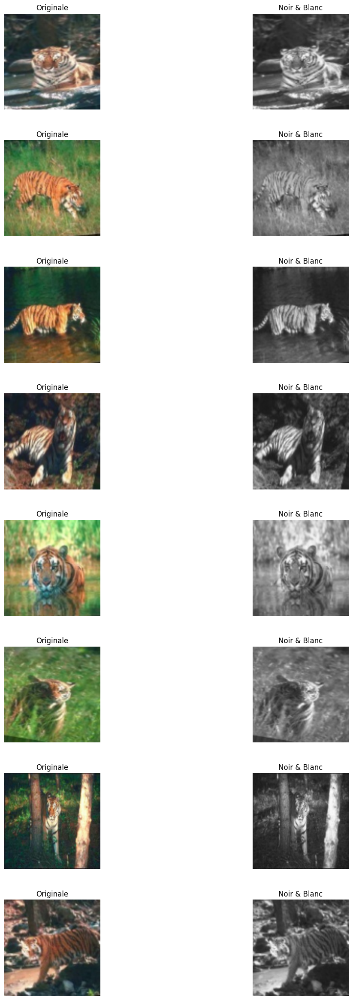

In [78]:
classes=['tiger']
target_size=INPUT_DIM[:2]
typeimage='blackwhite'
# Create the generator
mydataflow=my_image_generator(folder=PATH_TO_AUGMENTED, classes=classes, target_size=target_size,batch_size=BATCH_SIZE, typeimage=typeimage)

# Get a batch
batch = next(mydataflow)
display_images_from_batch(batch,typeimage )

In [80]:
# parameters of the model
LEARNING_RATE=.0005
steps_per_epoch=int(NUM_IMAGES / BATCH_SIZE)
EPOCHS=100
WEIGHTS_FOLDER = PATH_TO_MODELS + 'TigerAutoencoderWeights/'

In [81]:
tf.config.run_functions_eagerly(True)

autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='mean_squared_error' , metrics=['accuracy'])

# Create a validation data for plotting
# Getting the first batch
val_data_flow = next(mydataflow)

checkpoint_autoencoder = ModelCheckpoint(os.path.join(WEIGHTS_FOLDER, 'NBweights.h5'), save_weights_only = True, verbose=1)
history=autoencoder.fit(mydataflow,
                      shuffle=True,
                      epochs = EPOCHS,
                      initial_epoch = 0,
                      steps_per_epoch=steps_per_epoch,
                      validation_data=val_data_flow,
                      callbacks=[checkpoint_autoencoder])

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning:

Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.



98/98 [==============================] - ETA: 0s - loss: 0.0454 - accuracy: 0.4498
Epoch 1: saving model to models/TigerAutoencoderWeights/NBweights.h5
98/98 [==============================] - 14s 125ms/step - loss: 0.0454 - accuracy: 0.4498 - val_loss: 0.0394 - val_accuracy: 0.4370
Epoch 2/100
98/98 [==============================] - ETA: 0s - loss: 0.0304 - accuracy: 0.4758
Epoch 2: saving model to models/TigerAutoencoderWeights/NBweights.h5
98/98 [==============================] - 13s 129ms/step - loss: 0.0304 - accuracy: 0.4758 - val_loss: 0.0280 - val_accuracy: 0.4519
Epoch 3/100
98/98 [==============================] - ETA: 0s - loss: 0.0227 - accuracy: 0.5126
Epoch 3: saving model to models/TigerAutoencoderWeights/NBweights.h5
98/98 [==============================] - 14s 147ms/step - loss: 0.0227 - accuracy: 0.5126 - val_loss: 0.0246 - val_accuracy: 0.4919
Epoch 4/100
98/98 [==============================] - ETA: 0s - loss: 0.0195 - accuracy: 0.5549
Epoch 4: saving model to mode

In [85]:
# Si besoin de charger les poids
autoencoder.load_weights(WEIGHTS_FOLDER+'NBweights.h5')

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning:

Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.



1/1 [==============================] - 0s 116ms/step


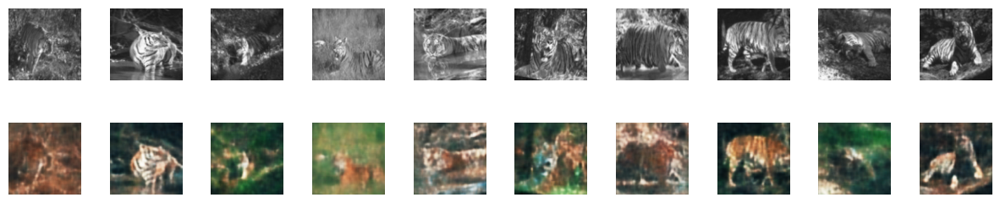

In [86]:
example_batch = next(mydataflow)
example_batch = example_batch[0]
example_images = example_batch[:10]
show_images(autoencoder,example_images)

## 8. (Exclusif) GAN et autoencodeurs variationnels

Alors qu'un auto-encodeur simple apprend à mapper chaque image sur un point fixe dans le latent space, l'encodeur d'un autoencodeur variationnel (VAE) mappe chaque image sur une distribution normale standard à z-dimensions (la taille du latent space). Le principe général est illustrée sur la figure suivante :   

<IMG SRC="http://www.lirmm.fr/~poncelet/Ressources/vae.png" align="center" width="600" height="300">

Le VAE étend l'autoencodeur classique en introduisant une composante probabiliste dans le processus d'encodage (la partie vecteur moyenne et vecteur écart type) afin de mieux considérer la distribution des données. Par rapport aux codes précédents, seul l'encoder est à modifier pour prendre en compte ces modifications.


**Remarque :** TensorFlow a des problèmes lors que l'on modifie la fonction de coût. Il faut exécuter la fonction suivante au début (cf. https://github.com/keras-team/keras/issues/16066).

In [ ]:
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


Le début est similaire mais il faut à présent ajouter des couches pour prendre en compte le vecteur moyenne, le vecteur écart type et la partie échantillonage :

In [ ]:
# ENCODER VAE
def build_vae_encoder(input_dim, output_dim):
  # By using clear_session we remove all the previous runs. That's a way to re-initialize
  global K
  K.clear_session()

  #  model input
  vae_encoder_input = Input(shape = input_dim, name = 'vae_encoder_input')
  x = vae_encoder_input

  # First convolution
  x= Conv2D(filters = 32,
            kernel_size = 3,
            strides = 2,
            padding = 'same', name = 'vae_encoder_conv_1')(x)
  # Applying the activation function
  x = LeakyReLU()(x)

  # Second Convolution
  x= Conv2D(filters = 64,
            kernel_size = 3,
            strides = 2,
            padding = 'same', name = 'vae_encoder_conv_2')(x)
  # Applying the activation function
  x = LeakyReLU()(x)

  # Third Convolution
  x= Conv2D(filters = 64,
            kernel_size = 3,
            strides = 2,
            padding = 'same', name = 'vae_encoder_conv_3')(x)
  # Applying the activation function
  x = LeakyReLU()(x)

   # Fourth Convolution
  x= Conv2D(filters = 64,
            kernel_size = 3,
            strides = 2,
            padding = 'same', name = 'vae_encoder_conv_4')(x)
  # Applying the activation function
  x = LeakyReLU()(x)


  # We need to get the latest shape before applying flatten for the decoder
  shape_before_flattening = K.int_shape(x)[1:]

  # Flatten the last CNN
  x = Flatten()(x)

  # Difference from the previous encoder
  # create a layer for the mean
  mean_mu = Dense(output_dim, name = 'mu')(x)
  # create a layer for the standard deviation
  log_var = Dense(output_dim, name = 'log_var')(x)

  # Defining a function for sampling
  def sampling(args):
    mean_mu, log_var = args
    epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.)
    return mean_mu + K.exp(log_var/2)*epsilon

  # Using a Keras Lambda Layer to include the sampling function as a layer
  # in the model. This is important for the gradient descent
  vae_encoder_output = Lambda(sampling, name='vae_encoder_output')([mean_mu, log_var])


  return vae_encoder_input, vae_encoder_output, mean_mu, log_var, shape_before_flattening, Model(vae_encoder_input, vae_encoder_output)


Comme précédemment on créé l'encoder du VAE :

In [ ]:
vae_encoder_input, vae_encoder_output,  mean_mu, log_var, shape_before_flattening, vae_encoder  = build_vae_encoder(input_dim = INPUT_DIM,
                                    output_dim = Z_DIM,
                                    )

vae_encoder.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 vae_encoder_input (InputLayer)  [(None, 128, 128, 3  0          []                               
                                )]                                                                
                                                                                                  
 vae_encoder_conv_1 (Conv2D)    (None, 64, 64, 32)   896         ['vae_encoder_input[0][0]']      
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 64, 64, 32)   0           ['vae_encoder_conv_1[0][0]']     
                                                                                                  
 vae_encoder_conv_2 (Conv2D)    (None, 32, 32, 64)   18496       ['leaky_re_lu[0][0]']        

Le decoder est complètement similaire à celui de l'autoencoder précédent. Dans la colonne suivante, nous renommons juste les variables pour avoir une présentation générale similaire.

In [ ]:
# DECODER FOR VAE - SAME THAT FOR AE

def build_vae_decoder(input_dim, shape_before_flattening):
  # Define model input
  vae_decoder_input = Input(shape = (input_dim,) , name = 'vae_decoder_input')

  # To get an exact mirror image of the encoder
  x = Dense(np.prod(shape_before_flattening))(vae_decoder_input)
  x = Reshape(shape_before_flattening)(x)

  # First Conv2DTranspose layer
  x = Conv2DTranspose(filters = 64,
                  kernel_size = 3,
                  strides = 2,
                  padding = 'same',
                  name = 'vae_decoder_conv_1'
                  )(x)
  # Applying the activation function
  x = LeakyReLU()(x)

  # Second Conv2DTranspose layer
  x = Conv2DTranspose(filters = 64,
                  kernel_size = 3,
                  strides = 2,
                  padding = 'same',
                  name = 'vae_decoder_conv_2'
                  )(x)
  # Applying the activation function
  x = LeakyReLU()(x)

  # Third Conv2DTranspose layer
  x = Conv2DTranspose(filters = 32,
                  kernel_size = 3,
                  strides = 2,
                  padding = 'same',
                  name = 'vae_decoder_conv_3'
                  )(x)
  # Applying the activation function
  x = LeakyReLU()(x)

  # Fouth Conv2DTranspose layer
  x = Conv2DTranspose(filters = 3,
                  kernel_size = 3,
                  strides = 2,
                  padding = 'same',
                  name = 'vae_decoder_conv_4'
                  )(x)
  # Applying the activation function
  x = Activation('sigmoid')(x)

  vae_decoder_output = x

  return vae_decoder_input, vae_decoder_output, Model(vae_decoder_input, vae_decoder_output)

On créé la partie decoder :

In [ ]:
vae_decoder_input, vae_decoder_output, vae_decoder = build_vae_decoder(input_dim = Z_DIM,
                                        shape_before_flattening = shape_before_flattening
                                        )
vae_encoder.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 vae_encoder_input (InputLayer)  [(None, 128, 128, 3  0          []                               
                                )]                                                                
                                                                                                  
 vae_encoder_conv_1 (Conv2D)    (None, 64, 64, 32)   896         ['vae_encoder_input[0][0]']      
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 64, 64, 32)   0           ['vae_encoder_conv_1[0][0]']     
                                                                                                  
 vae_encoder_conv_2 (Conv2D)    (None, 32, 32, 64)   18496       ['leaky_re_lu[0][0]']        

Nous pouvons créer le vae :

In [ ]:
vae_autoencoder_input = vae_encoder_input
vae_autoencoder_output = vae_decoder(vae_encoder_output)
vae_autoencoder = Model(vae_autoencoder_input, vae_autoencoder_output)
vae_autoencoder.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 vae_encoder_input (InputLayer)  [(None, 128, 128, 3  0          []                               
                                )]                                                                
                                                                                                  
 vae_encoder_conv_1 (Conv2D)    (None, 64, 64, 32)   896         ['vae_encoder_input[0][0]']      
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 64, 64, 32)   0           ['vae_encoder_conv_1[0][0]']     
                                                                                                  
 vae_encoder_conv_2 (Conv2D)    (None, 32, 32, 64)   18496       ['leaky_re_lu[0][0]']      

Jusqu'à présent nous avons vu que les modifications sont assez simples au niveau de l'encoder et que le decoder n'avait pas besoin d'être modifié. Pour le decoder il faut ajouter une couche pour la moyenne, une pour l'écart type, avoir une fonction qui permet de faire de l'échantillonage sur la distribution et ajouter cette échantillonage dans une couche afin que la descente de gradient puisse être réalisée.   

**Quid de la fonction de coût ?** pour l'autoencoder nous avions vu que nous pouvions prendre MSE - *Mean Square Error* - (nous aurions pu prendre un autre fonction de coût comme comme cross-entropy). Cette fonction permet de mettre à jour les poids dans le modèle. Par contre, à présent, nous avons un autre élément qui doit être mis à jour : bien choisir la distribution pour l'échantillonage !!   

Pour cela il existe la **divergence de Kullback-Leibler (KL)** qui est une mesure de la différence entre deux distributions de probabilité. Elle est souvent utilisée dans le domaine de l'information et de la théorie de l'information pour comparer deux distributions de probabilité et quantifier leur similarité ou leur dissimilarité. Elle mesure à quel point une distribution de probabilité diffère d'une distribution de référence. Pour nous elle peut être utilisée pour mesurer à quel point la distribution de l'échantillon est similaire à celles des images d'entrée. C'est grâce à cela que nous pouvons forcer le latent space à avoir des distributions similaires aux images d'entrée !!!   

Pour finaliser notre VAE il s'agit donc de modifier la fonction de coût pour qu'elle prenne en compte la MSE et la KL divergence.   

La fonction de coût est une somme de MSE et de KL Divergence. Une pondération est attribuée à la perte MSE, connue sous le nom de facteur de perte (*B*). Le facteur de perte est multiplié par la perte MSE. Si nous utilisons un facteur de perte élevé, nous privilégions la MSE et donc nous nous retrouvons comme avec un autoencoder simple. De la même manière si la perte est trop faible, la qualité des images générées sera mauvaise.   

La cellule suivante propose la nouvelle fonction de coût :


In [ ]:

B = 10000

def kl_loss(y_true, y_pred):
    kl_loss =  -0.5 * K.sum(1 + log_var - K.square(mean_mu) - K.exp(log_var), axis = 1)
    return kl_loss
def r_loss(y_true, y_pred):
    return K.mean(K.square(y_true - y_pred), axis = [1,2,3])

def total_loss(y_true, y_pred):
    return B*r_loss(y_true, y_pred) + kl_loss(y_true, y_pred)



Réinitialisation de toutes les variables. Remarque BATCH_SIZE a été diminué par rapport à l'autoencoder car le modèle prend beaucoup en RAM. En diminuant le BATCH_SIZE moins d'images sont générées par ImageDataGenerator.

In [ ]:
DATA_FOLDER = "Humans2"
NUM_IMAGES=len(os.listdir(DATA_FOLDER))
EPOCH=25
WEIGHTS_FOLDER = './myweights/'

# Get all the file names with extension .jpg from DATA_FOLDER/train
filenames = np.array(glob(os.path.join(DATA_FOLDER+'/train', '*.jpg')))
NUM_IMAGES = len(filenames)
print("Total number of images : " + str(NUM_IMAGES))

INPUT_DIM = (128,128,3) # Image dimension
BATCH_SIZE = 256 # batchsize dimension
Z_DIM = 200 # Dimension of the latent vector

data_flow = ImageDataGenerator(rescale=1./255).flow_from_directory(DATA_FOLDER,
                                                                  classes=['train'],
                                                                   target_size = INPUT_DIM[:2],
                                                                   batch_size = BATCH_SIZE,
                                                                   shuffle = True,
                                                                   color_mode='rgb',
                                                                   seed=42,
                                                                   class_mode = 'input'
                                                                   )

# parameters of the model
LEARNING_RATE=.0005
steps_per_epoch=int(NUM_IMAGES / BATCH_SIZE)
EPOCHS=40

Total number of images : 6973
Found 7219 images belonging to 1 classes.


Par la suite, le principe est le même, il suffit de prendre en compte la nouvelle fonction de coût.

**CO2 !!! Remarque IMPORTANTE** Pour gagner du temps (**l'apprentissage est très long**) , éviter de relancer l'apprentissage et du CO2 un modèle appris est disponible. Nous l'utilisons juste après. Si vous voulez le lancer il faut enlever les commentaires dans la cellule ci-dessous.

In [ ]:
#vae_autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss = total_loss, metrics = [r_loss, kl_loss])
# Generate a validation data
#val_data_flow=next(data_flow)
#checkpoint_vae_autoencoder = ModelCheckpoint(os.path.join(WEIGHTS_FOLDER, 'VAEweights.h5'), save_weights_only = True, verbose=1)
#history=vae_autoencoder.fit(data_flow,
                      shuffle=True,
                      epochs = EPOCHS,
                      initial_epoch = 0,
                      steps_per_epoch=steps_per_epoch,
                      validation_data=val_data_flow,
                      callbacks=[checkpoint_vae_autoencoder])

RuntimeError: ignored

La cellule suivante affiche des images en utilisant le variational autoencoder. Comme nous pouvons le constater les images sont assez similaires à celles obtenues via un autoencoder. En fait le variational autoencoder permet de comprimer les images mais surtout en prenant en compte la distribution des données d'entrées, permet d'utiliser ce latent space pour générer de nouvelles images qui n'existent pas.

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


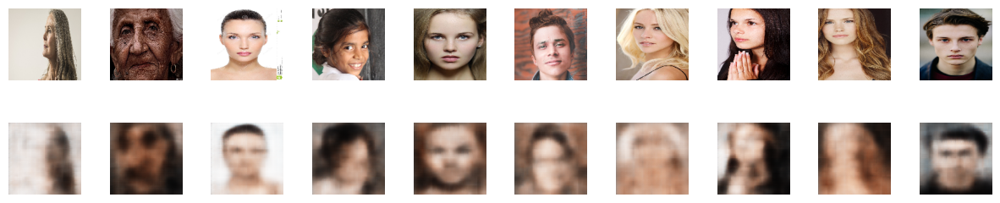

In [ ]:
example_batch = next(data_flow)
example_batch = example_batch[0]
example_images = example_batch[:10]
show_images(vae_autoencoder,example_images)

A présent nous pouvons générer de nouvelles images :

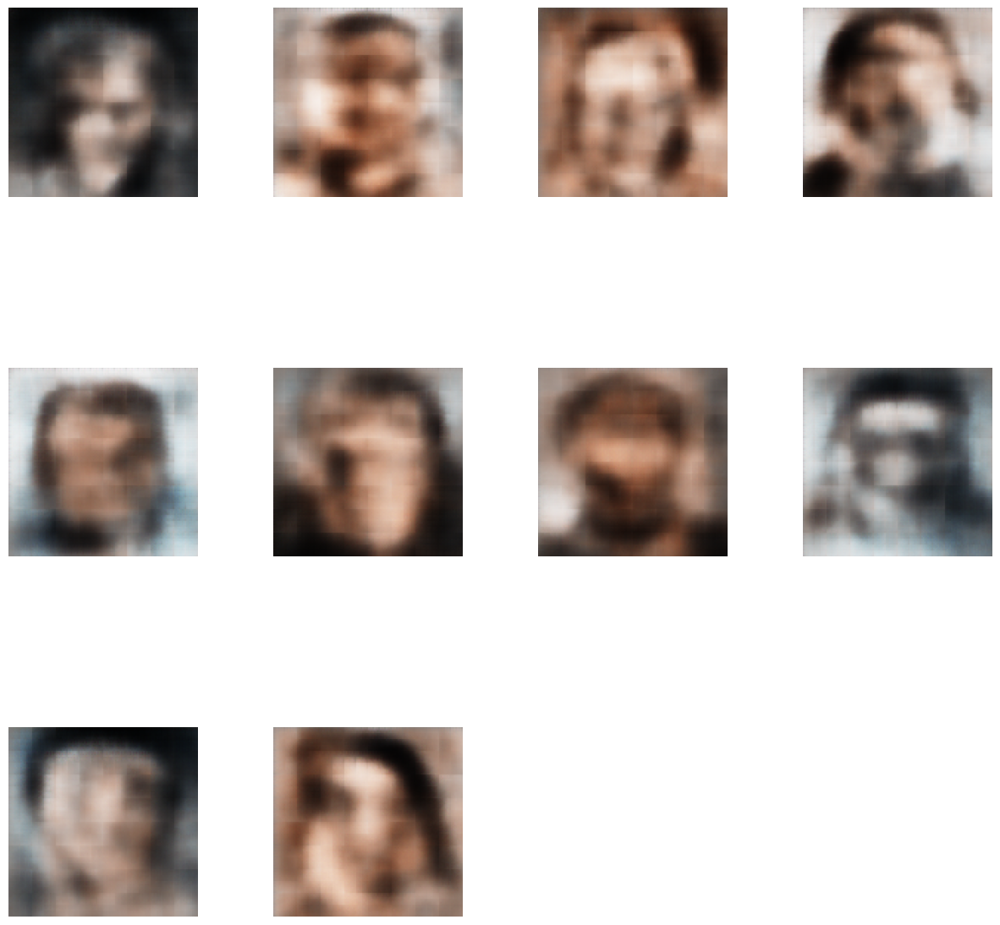

In [ ]:
def generate_images_from_noise(n_to_show=10):
    # For n_to_show images, we create a normal distribution sample between 0 and 1
    normal_distribution_sample = np.random.normal(0, 1, size=(n_to_show, Z_DIM))

    # we apply the decoder part to the samples to see what is generated
    reconst_images = vae_decoder.predict(normal_distribution_sample)

    # Plots the figures
    fig = plt.figure(figsize=(15, 15))  # Increase figure size
    rows = int(np.ceil(n_to_show / 4))  # Calculate number of rows needed
    columns = 4  # Set number of columns per row
    fig.subplots_adjust(hspace=0.4, wspace=0.4)

    for i in range(n_to_show):
        img = reconst_images[i].squeeze()
        sub = fig.add_subplot(rows, columns, i + 1)  # Update subplot position
        sub.axis('off')
        sub.imshow(img)

generate_images_from_noise()